**Homework 1** <br>
**Explaianble AI Fall 2024**

**Total points:** 15 (15 + 1 bonus pt)<br>
**Overall Goal:** Feature Importance Explainablity on Supvervised Learning Models
**Due:** 10/18/2024

**Notes:**
* complete in colab or on your own local jupyter notebook
* submission is file upload (download your notebook as a .pynb)
* sample dataset can be found in canvass files: 'HW1 files/'



<span style="color:red">**Files for quesiton 1 and 2 can be found in canvas files at HW1/data/q1_2**</span>.

**1. Using Shap**<br>
A Fraud Analyst has flagged a number of local prediction of a model as false positives. That has caused some doubt about the overall use of your model.<br><br>
You're working as an external consultant. Given the datasets, and the local predictions in question, build a case to support one of the following recommendations:
* **Keep the model**
* **Abandon model**
* **Inconclusive**
<br><br>
Use Shap in your analysis, along with any other tools you choose to make your case. Your recommendation (a short write up) must be supported by your evidence. Feel free to use plots, stats and whatever else to support your outcome.   

**5pts**

1. Install and Load libraries

In [32]:
!pip install shap
!pip install lime
!pip install alibi
!pip install dice-ml
!pip install seaborn
!pip install --upgrade pandas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 28.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 44.0 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.2
    Uninstalling pandas-2.2.2:
      Successfully uninstalled pandas-2.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.10.1 requires pandas<2.2.3dev0,>=2.0, but you have pandas 1.5.3 which is incompatible.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 1.5.3 which is incompatible.
mizani 0.11.4 requires pandas>=2.1.0, but you have pandas 1.5.3 which is incompatible.
plotnine 0.13.6 requires pandas<3.0.0,>=2.1.0, but you have pandas 1.5.3 which is incompatible.
xarray 2024.9.0 requires pandas>=2.1, but you have pandas 1.5.3 which is incompatible.


In [33]:
import pickle
import shap
import pandas as pd
import numpy as np

from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

import lime
import lime.lime_tabular
from alibi.explainers import AnchorTabular

import dice_ml
from dice_ml.utils import helpers

import seaborn as sns

2. Determine the type of model

In [4]:
with open('HW1_q1_2_model.pkl', 'rb') as file:
  loaded_model = pickle.load(file)
model_type = type(loaded_model)

print(f"The model type is: {model_type}")

print(loaded_model)a

The model type is: <class 'xgboost.sklearn.XGBClassifier'>
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [07:29:09] WARNING: /workspace/src/collective/../data/../common/error_msg.h:80: If you are loading a serialized model (like pickle in Python, RDS in R) or
configuration generated by an older version of XGBoost, please export the model by calling
`Booster.save_model` from that version first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/stable/tutorials/saving_model.html

for more details about differences between saving model and serializing.

  warnings.warn(smsg, UserWarning)


3. View the data and assign test, train data

In [5]:
X_test_data = pd.read_csv('HW1_q1_2_X_test.csv')
X_train_data = pd.read_csv('HW1_q1_2_X_train.csv')
y_test_data = pd.read_csv('HW1_q1_2_y_test.csv')
y_train_data = pd.read_csv('HW1_q1_2_y_train.csv')

X_train_data.head()

,trans_amount,avail_credit,account_age,is_Client Expenses,is_Office Supplies,is_Payroll,is_Rent,is_Utilities,is_Vendor Payments,"is_Agriculture, Forestry, And Fishing",is_Construction,"is_Finance, Insurance, And Real Estate",is_Retail Trade,is_Wholesale Trade,metro_encoded,income_encoded
0,1274.57,48378.41,481,0,1,0,0,0,0,1,0,0,0,0,1940,4
1,911.85,10391.69,239,0,0,0,0,0,1,0,1,0,0,0,1873,4
2,1547.09,18748.69,463,1,0,0,0,0,0,0,0,1,0,0,1688,2
3,271.27,45908.63,304,0,1,0,0,0,0,0,1,0,0,0,1873,3
4,225.31,12223.18,409,0,0,0,1,0,0,0,0,0,0,1,1688,1


In [6]:
y_train_data.head()

,is_fraud
0,0
1,0
2,1
3,0
4,1


In [7]:
y_pred_proba = loaded_model.predict_proba(X_test_data)[:, 1]
y_pred = loaded_model.predict(X_test_data)

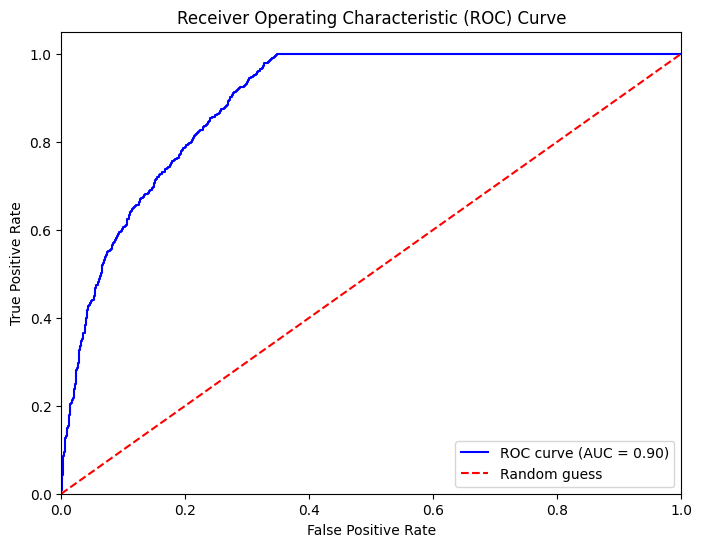

In [8]:
fpr, tpr, thresholds = roc_curve(y_test_data, y_pred_proba)
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


## Observation on the above graph:
This ROC curve, with an AUC of 0.90, suggests that the XGBoost model has strong discriminatory power, with high True Positive Rates and relatively low False Positive Rates across various thresholds. This is a good indication that the model is effective for this classification task.

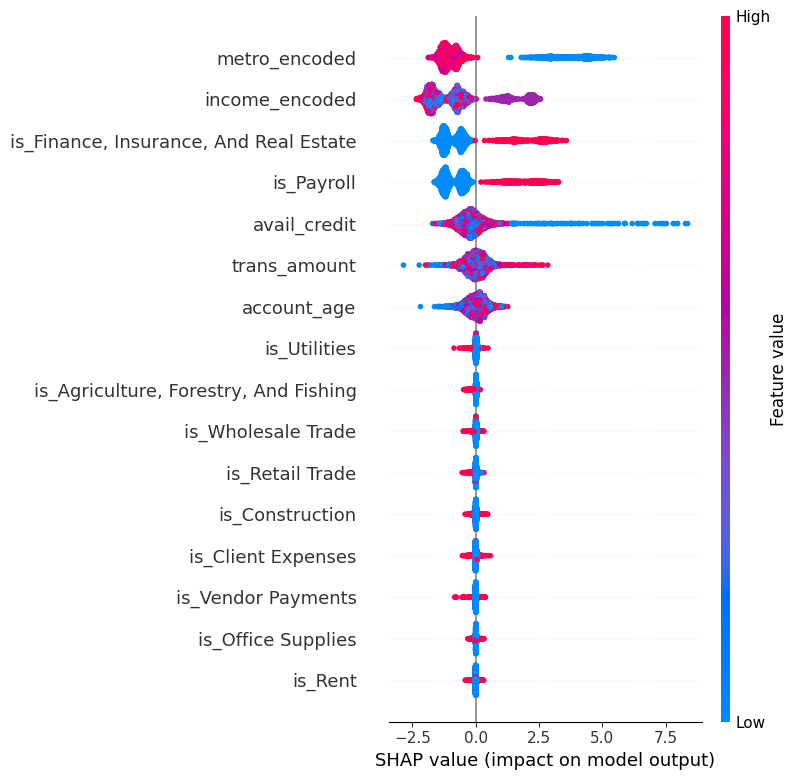

In [9]:
explainer = shap.TreeExplainer(loaded_model)
shap_values = explainer.shap_values(X_test_data)
shap.initjs()

# Summary plot
shap.summary_plot(shap_values, X_test_data)

# Force plot for a single prediction
shap.force_plot(explainer.expected_value, shap_values[0,:], X_test_data.iloc[0,:])

In [10]:
confusion_matrix(y_test_data, y_pred)

array([[1794,  313],
       [ 299,  687]])

In [11]:
y_test_data.value_counts()

,count
is_fraud,
0,2107
1,986


In [12]:
np.unique(y_pred, return_counts=True)

(array([0, 1]), array([2093, 1000]))

In [13]:
results_df = pd.DataFrame(y_pred, columns=['predicted_label'])
results_df['true_label'] = y_test_data.values

false_positives = results_df[(results_df['true_label'] == 0) & (results_df['predicted_label'] == 1)]

results_df.head()

,predicted_label,true_label
0,1,0
1,0,0
2,0,0
3,0,0
4,0,0


In [14]:
false_positives.head()


,predicted_label,true_label
0,1,0
16,1,0
19,1,0
33,1,0
35,1,0


In [15]:
false_positive_data_points = X_test_data.loc[false_positives.index]
false_positive_data_points.head()

,trans_amount,avail_credit,account_age,is_Client Expenses,is_Office Supplies,is_Payroll,is_Rent,is_Utilities,is_Vendor Payments,"is_Agriculture, Forestry, And Fishing",is_Construction,"is_Finance, Insurance, And Real Estate",is_Retail Trade,is_Wholesale Trade,metro_encoded,income_encoded
0,1679.57,42144.36,603,0,0,0,0,0,1,0,0,0,0,1,1688,4
16,1114.35,36255.49,538,0,0,0,0,1,0,0,0,0,1,0,1964,2
19,429.37,9856.44,330,0,0,0,0,1,0,0,0,1,0,0,1873,4
33,1089.28,44677.19,613,0,1,0,0,0,0,0,0,1,0,0,1873,2
35,1405.00,30090.21,692,0,0,0,0,0,1,1,0,0,0,0,1940,2


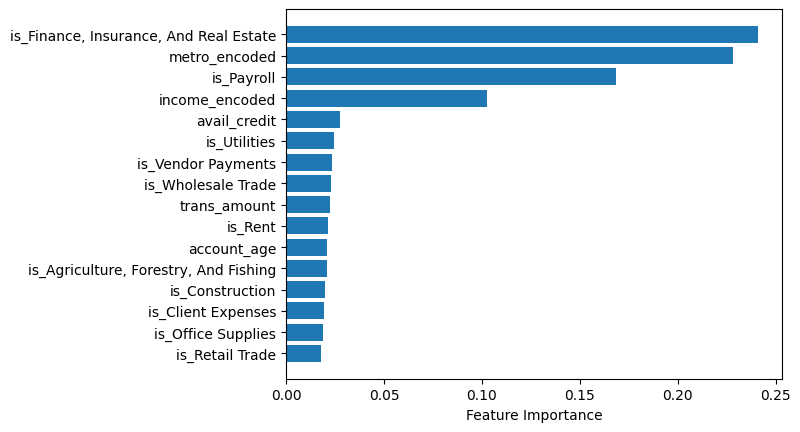

In [16]:
sorted_idx = loaded_model.feature_importances_.argsort()
plt.barh(X_test_data.columns[sorted_idx], loaded_model.feature_importances_[sorted_idx])
plt.xlabel("Feature Importance")
plt.show()

In [17]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_test_data.values,
    mode="classification",
    feature_names=X_test_data.columns,
    class_names=["is_fraud"],  # Single class name
    discretize_continuous=True
)

lime_explanations = []

for idx in false_positive_data_points[:5].index:
    instance = X_test_data.loc[idx].values.reshape(1, -1)

    explanation = explainer.explain_instance(instance[0], loaded_model.predict_proba)

    lime_explanations.append((idx, explanation))

    print(f"Explanation for instance {idx}")
    explanation.show_in_notebook()

Explanation for instance 0


Explanation for instance 16


Explanation for instance 19


Explanation for instance 33


Explanation for instance 35


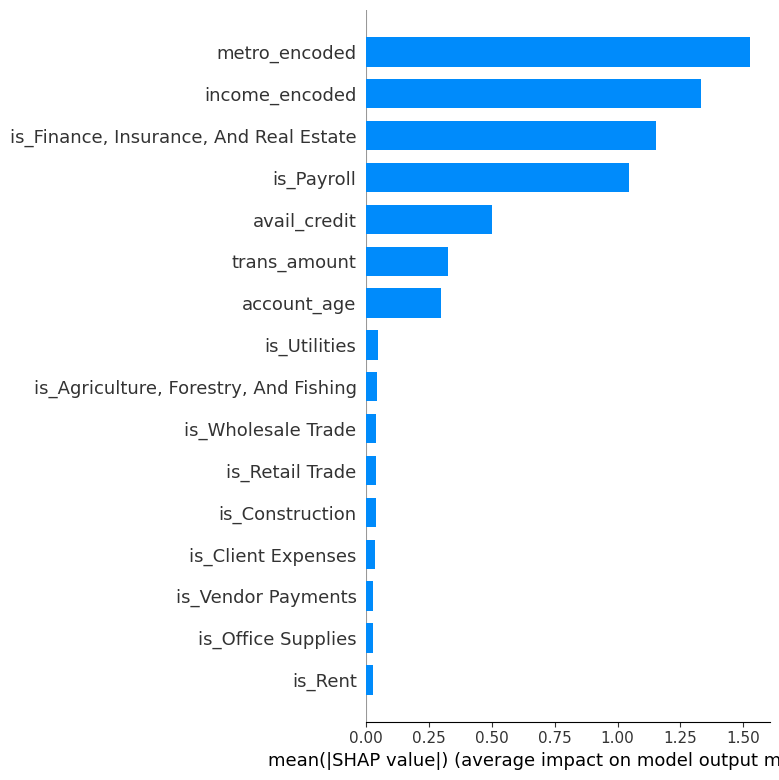

In [18]:
shap.summary_plot(shap_values, X_test_data, plot_type="bar")

## Observation

- **Top Influential Features:** `metro_encoded` and `income_encoded` have the highest impact on predictions.
- **Understanding SHAP Values:**
   - SHAP values on the x-axis show whether each feature pushes predictions higher (positive) or lower (negative).
   - Colors represent feature values: **red** means high, **blue** means low.
   - For instance, higher `income_encoded` values (red) tend to increase predictions.
- **Feature Behavior:**
   - Some features, like `avail_credit`, have a wide spread in SHAP values, indicating varied impacts.
   - Binary features, such as `is_Payroll`, form distinct clusters.

Overall, demographic and financial features strongly influence the model’s predictions, with high values generally pushing predictions up.

### Next Steps

Since I’m unsure if `metro_encoded` should have such a strong impact (it seems high for a location-related feature), I would:
- Communicate the key influencing features to stakeholders.
- Consider pruning the tree or applying regularization and cross-validation to refine model performance.

**2. Anchors**

After submitting your results from question 1, your boss pushes back and asks you do do some more work. You decide to use a rule based explainer on the false positive data points.
* Interpret the explanations (percision and coverage) for your analysis
* How do these additional explanations support or refute your recommendation from question 1?
* What do you recommend as next steps?

**5pts**


In [19]:
explainer = AnchorTabular(loaded_model.predict, X_train_data.columns)
explainer.fit(X_train_data.to_numpy())

AnchorTabular(meta={
  'name': 'AnchorTabular',
  'type': ['blackbox'],
  'explanations': ['local'],
  'params': {'seed': None, 'disc_perc': (25, 50, 75)},
  'version': '0.9.6'}
)

In [20]:
for i, row in false_positive_data_points.iterrows():
    explanation = explainer.explain(row.values.reshape(1, -1))
    print(f"Explanation for false positive instance{i} : {explanation.anchor}\n")

Explanation for false positive instance0 : ['metro_encoded <= 1873.00', 'income_encoded > 1.00', 'is_Construction <= 0.00', 'is_Utilities <= 0.00', 'is_Office Supplies <= 0.00', 'is_Retail Trade <= 0.00', 'account_age > 182.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'trans_amount > 1488.87', 'is_Client Expenses <= 0.00', 'is_Rent <= 0.00', 'avail_credit > 25145.97']



Explanation for false positive instance16 : ['1.00 < income_encoded <= 2.00', '359.00 < account_age <= 544.00', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', '25145.97 < avail_credit <= 37446.05', 'trans_amount <= 1488.87', 'is_Rent <= 0.00', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Retail Trade > 0.00']

Explanation for false positive instance19 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', 'income_encoded > 1.00', 'trans_amount <= 494.20', '182.00 < account_age <= 359.00', 'is_Utilities > 0.00', 'is_Retail Trade <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Rent <= 0.00', 'is_Client Expenses <= 0.00']

Explanation for false positive instance33 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', 'account_age > 544.00', 'is_Construction <= 0.00', 'avail_credit > 25145.97', '1.00 < income_encoded <= 2.00']



Explanation for false positive instance35 : ['1906.00 < metro_encoded <= 1940.00', '1.00 < income_encoded <= 2.00', 'avail_credit > 25145.97', 'account_age > 544.00', '494.20 < trans_amount <= 1488.87', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Retail Trade <= 0.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance43 : ['metro_encoded <= 1873.00', 'avail_credit <= 12430.43', '494.20 < trans_amount <= 1007.64', 'is_Client Expenses <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Retail Trade <= 0.00', 'is_Rent <= 0.00', '182.00 < account_age <= 544.00', 'is_Office Supplies <= 0.00', 'is_Construction <= 0.00', 'income_encoded > 1.00']



Explanation for false positive instance49 : ['is_Payroll > 0.00', 'trans_amount <= 1007.64', '1.00 < income_encoded <= 3.00', 'account_age > 182.00', 'is_Rent <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'avail_credit > 25145.97', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance70 : ['metro_encoded <= 1873.00', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Office Supplies <= 0.00', 'is_Wholesale Trade <= 0.00', 'income_encoded <= 3.00', 'is_Client Expenses <= 0.00', 'is_Rent <= 0.00', 'trans_amount > 494.20', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance78 : ['metro_encoded <= 1873.00', 'avail_credit <= 12430.43', 'is_Construction > 0.00', 'account_age <= 182.00', 'trans_amount > 1007.64', 'income_encoded > 1.00', 'is_Office Supplies <= 0.00', 'is_Rent <= 0.00', 'is_Utilities <= 0.00', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance89 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', 'metro_encoded <= 1906.00', 'income_encoded <= 2.00', 'is_Construction <= 0.00', 'is_Utilities <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'trans_amount > 1007.64', 'is_Rent <= 0.00', 'is_Client Expenses <= 0.00', 'avail_credit <= 12430.43', 'is_Wholesale Trade <= 0.00', 'is_Retail Trade <= 0.00', 'is_Payroll <= 0.00']



Explanation for false positive instance93 : ['is_Payroll > 0.00', 'account_age > 544.00', '1873.00 < metro_encoded <= 1906.00', 'is_Retail Trade <= 0.00', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', '25145.97 < avail_credit <= 37446.05', 'trans_amount > 494.20', 'is_Client Expenses <= 0.00', 'income_encoded > 1.00', 'is_Vendor Payments <= 0.00', 'is_Utilities <= 0.00']



Explanation for false positive instance94 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', '1.00 < income_encoded <= 3.00', 'avail_credit > 12430.43', 'is_Construction <= 0.00', 'trans_amount > 494.20', 'is_Vendor Payments <= 0.00', 'is_Client Expenses <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Office Supplies <= 0.00']

Explanation for false positive instance99 : ['is_Payroll > 0.00', '1.00 < income_encoded <= 2.00', 'trans_amount <= 1007.64', '359.00 < account_age <= 544.00', 'is_Office Supplies <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', '12430.43 < avail_credit <= 25145.97', 'is_Construction <= 0.00', 'is_Utilities <= 0.00']



Explanation for false positive instance113 : ['is_Payroll > 0.00', 'income_encoded > 1.00', '494.20 < trans_amount <= 1007.64', 'avail_credit > 25145.97', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00']



Explanation for false positive instance115 : ['metro_encoded <= 1873.00', 'avail_credit <= 12430.43', 'income_encoded <= 1.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Utilities <= 0.00', 'account_age > 359.00', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00', 'trans_amount <= 1488.87']



Explanation for false positive instance123 : ['metro_encoded <= 1873.00', 'income_encoded <= 2.00', 'is_Construction <= 0.00', 'is_Retail Trade <= 0.00', 'is_Utilities <= 0.00', 'trans_amount > 1488.87', 'is_Office Supplies > 0.00', 'is_Client Expenses <= 0.00', 'is_Wholesale Trade <= 0.00']



Explanation for false positive instance133 : ['is_Payroll > 0.00', 'income_encoded <= 2.00', 'avail_credit <= 12430.43', 'is_Construction > 0.00', 'account_age <= 182.00', '494.20 < trans_amount <= 1007.64', 'is_Vendor Payments <= 0.00', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance138 : ['metro_encoded <= 1873.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'income_encoded <= 2.00', '182.00 < account_age <= 359.00', 'is_Office Supplies > 0.00', 'avail_credit > 37446.05']



Explanation for false positive instance153 : ['metro_encoded <= 1873.00', 'avail_credit <= 12430.43', '1.00 < income_encoded <= 2.00', 'trans_amount > 1488.87', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'account_age <= 359.00', 'is_Utilities <= 0.00']



Explanation for false positive instance163 : ['is_Finance, Insurance, And Real Estate > 0.00', '1.00 < income_encoded <= 2.00', 'avail_credit > 25145.97', 'metro_encoded <= 1906.00', 'is_Utilities <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Client Expenses <= 0.00', 'is_Retail Trade <= 0.00']



Explanation for false positive instance164 : ['metro_encoded <= 1873.00', 'income_encoded <= 2.00', '359.00 < account_age <= 544.00', 'is_Retail Trade <= 0.00', 'is_Utilities <= 0.00', 'is_Construction <= 0.00', 'is_Vendor Payments <= 0.00', '494.20 < trans_amount <= 1007.64', 'is_Office Supplies <= 0.00', 'is_Client Expenses <= 0.00', 'avail_credit > 37446.05', 'is_Rent > 0.00', 'is_Wholesale Trade <= 0.00']



Explanation for false positive instance165 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'avail_credit <= 12430.43', '494.20 < trans_amount <= 1007.64', '1.00 < income_encoded <= 3.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00', 'is_Construction <= 0.00', 'is_Client Expenses <= 0.00', 'account_age > 359.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance170 : ['1.00 < income_encoded <= 2.00', 'trans_amount <= 494.20', '359.00 < account_age <= 544.00', 'is_Client Expenses > 0.00', 'is_Construction <= 0.00', '25145.97 < avail_credit <= 37446.05', 'is_Utilities <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Office Supplies <= 0.00', 'metro_encoded > 1940.00', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance172 : ['avail_credit <= 12430.43', '1.00 < income_encoded <= 2.00', '182.00 < account_age <= 544.00', 'is_Retail Trade <= 0.00', 'is_Construction <= 0.00', 'is_Utilities <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Client Expenses <= 0.00', 'is_Rent <= 0.00']

Explanation for false positive instance180 : ['is_Finance, Insurance, And Real Estate > 0.00', 'avail_credit > 37446.05', '1873.00 < metro_encoded <= 1906.00', '182.00 < account_age <= 544.00', 'trans_amount <= 494.20', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'is_Rent <= 0.00', 'is_Client Expenses <= 0.00', 'is_Utilities <= 0.00', 'is_Wholesale Trade <= 0.00', 'income_encoded > 3.00', 'is_Retail Trade <= 0.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance182 : ['metro_encoded <= 1873.00', 'is_Utilities <= 0.00', 'income_encoded > 1.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', '494.20 < trans_amount <= 1007.64', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Retail Trade <= 0.00', 'is_Vendor Payments <= 0.00', '25145.97 < avail_credit <= 37446.05']



Explanation for false positive instance188 : ['metro_encoded <= 1940.00', '1.00 < income_encoded <= 2.00', 'account_age > 182.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00', 'is_Utilities <= 0.00', 'avail_credit > 25145.97']

Explanation for false positive instance191 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', 'income_encoded > 1.00', '182.00 < account_age <= 359.00', 'trans_amount <= 494.20', '12430.43 < avail_credit <= 25145.97', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Rent <= 0.00', 'is_Construction <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Client Expenses <= 0.00', 'is_Retail Trade <= 0.00']



Explanation for false positive instance195 : ['is_Finance, Insurance, And Real Estate > 0.00', 'avail_credit > 25145.97', 'income_encoded <= 2.00', 'trans_amount <= 1007.64', 'is_Office Supplies <= 0.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Rent <= 0.00', 'is_Wholesale Trade <= 0.00']

Explanation for false positive instance197 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 359.00', '25145.97 < avail_credit <= 37446.05', '494.20 < trans_amount <= 1007.64', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'is_Vendor Payments > 0.00', 'income_encoded > 1.00', 'is_Office Supplies <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00']



Explanation for false positive instance205 : ['is_Payroll > 0.00', 'income_encoded > 1.00', '494.20 < trans_amount <= 1007.64', 'is_Retail Trade <= 0.00', 'avail_credit > 12430.43', 'is_Rent <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00', 'account_age > 182.00']

Explanation for false positive instance221 : ['is_Finance, Insurance, And Real Estate > 0.00', 'is_Payroll > 0.00', 'account_age > 544.00', '12430.43 < avail_credit <= 37446.05']



Explanation for false positive instance230 : ['1.00 < income_encoded <= 2.00', 'account_age > 359.00', 'trans_amount <= 1007.64', 'avail_credit > 12430.43', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00']

Explanation for false positive instance247 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', 'income_encoded > 1.00', '25145.97 < avail_credit <= 37446.05', 'is_Construction <= 0.00', 'is_Office Supplies <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Vendor Payments <= 0.00', 'trans_amount <= 1007.64', 'is_Rent <= 0.00', 'metro_encoded <= 1906.00']



Explanation for false positive instance249 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'income_encoded > 1.00', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00', '494.20 < trans_amount <= 1007.64', 'account_age <= 359.00', 'is_Office Supplies <= 0.00', 'is_Rent <= 0.00', 'avail_credit > 12430.43', 'is_Construction > 0.00']



Explanation for false positive instance250 : ['metro_encoded <= 1873.00', 'avail_credit <= 12430.43', '1007.64 < trans_amount <= 1488.87', '1.00 < income_encoded <= 3.00', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Office Supplies <= 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance278 : ['is_Finance, Insurance, And Real Estate > 0.00', '1.00 < income_encoded <= 2.00', 'avail_credit > 25145.97', 'is_Office Supplies > 0.00', 'is_Utilities <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00', 'is_Client Expenses <= 0.00', 'trans_amount > 494.20', 'is_Construction <= 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance280 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', '25145.97 < avail_credit <= 37446.05', 'is_Utilities > 0.00', 'metro_encoded <= 1906.00', 'is_Construction <= 0.00', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Rent <= 0.00', 'is_Client Expenses <= 0.00', 'is_Retail Trade <= 0.00']



Explanation for false positive instance301 : ['metro_encoded <= 1873.00', '12430.43 < avail_credit <= 25145.97', 'income_encoded <= 2.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00', 'is_Rent <= 0.00', 'account_age > 544.00', '1007.64 < trans_amount <= 1488.87', 'is_Utilities <= 0.00', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance309 : ['metro_encoded <= 1873.00', 'income_encoded <= 2.00', 'trans_amount > 1488.87', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00']



Explanation for false positive instance316 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1906.00', 'income_encoded <= 2.00', '25145.97 < avail_credit <= 37446.05', 'account_age > 182.00', 'is_Construction <= 0.00', 'is_Client Expenses <= 0.00', 'is_Utilities <= 0.00', 'is_Office Supplies <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Wholesale Trade <= 0.00']



Explanation for false positive instance321 : ['metro_encoded <= 1906.00', '1.00 < income_encoded <= 2.00', 'is_Vendor Payments > 0.00', 'account_age > 182.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', '12430.43 < avail_credit <= 37446.05', 'trans_amount <= 1007.64', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance340 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', 'account_age > 359.00', 'avail_credit > 25145.97', 'income_encoded <= 2.00', 'is_Office Supplies <= 0.00', 'is_Client Expenses <= 0.00', 'is_Construction <= 0.00', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Rent <= 0.00']

Explanation for false positive instance370 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', 'avail_credit > 25145.97', '1.00 < income_encoded <= 3.00', '494.20 < trans_amount <= 1007.64', 'is_Construction <= 0.00']



Explanation for false positive instance371 : ['is_Payroll > 0.00', 'metro_encoded <= 1906.00', '1.00 < income_encoded <= 2.00', '494.20 < trans_amount <= 1007.64', '182.00 < account_age <= 359.00', 'is_Wholesale Trade <= 0.00', 'is_Client Expenses <= 0.00', '25145.97 < avail_credit <= 37446.05', 'is_Utilities <= 0.00', 'is_Retail Trade <= 0.00', 'is_Construction <= 0.00']



Explanation for false positive instance375 : ['metro_encoded <= 1873.00', 'avail_credit <= 12430.43', 'income_encoded <= 1.00', 'is_Construction > 0.00', 'account_age > 544.00', '494.20 < trans_amount <= 1007.64', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00', 'is_Retail Trade <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00']



Explanation for false positive instance381 : ['metro_encoded <= 1873.00', '1.00 < income_encoded <= 2.00', 'account_age > 182.00', 'trans_amount <= 494.20', 'avail_credit > 25145.97', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance389 : ['is_Payroll > 0.00', 'account_age > 544.00', '1.00 < income_encoded <= 3.00', 'is_Wholesale Trade <= 0.00', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Utilities <= 0.00', 'avail_credit > 12430.43', 'is_Client Expenses <= 0.00']



Explanation for false positive instance394 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'avail_credit <= 12430.43', 'income_encoded <= 2.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Office Supplies <= 0.00', 'trans_amount <= 1488.87', 'is_Rent <= 0.00', 'account_age > 359.00', 'is_Construction <= 0.00', 'is_Retail Trade > 0.00', 'is_Wholesale Trade <= 0.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance401 : ['1.00 < income_encoded <= 2.00', 'trans_amount <= 494.20', '182.00 < account_age <= 359.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Vendor Payments <= 0.00', 'avail_credit > 12430.43', 'is_Wholesale Trade <= 0.00', 'is_Rent <= 0.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance417 : ['metro_encoded <= 1873.00', 'avail_credit <= 12430.43', 'income_encoded <= 1.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Office Supplies <= 0.00', 'is_Rent <= 0.00', 'account_age > 544.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', 'is_Retail Trade <= 0.00', 'is_Construction <= 0.00', 'trans_amount <= 1488.87']



Explanation for false positive instance424 : ['is_Payroll > 0.00', '359.00 < account_age <= 544.00', 'income_encoded > 1.00', '494.20 < trans_amount <= 1007.64', 'metro_encoded > 1940.00', 'is_Vendor Payments <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00']

Explanation for false positive instance425 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', 'is_Vendor Payments > 0.00', 'metro_encoded > 1940.00', '1.00 < income_encoded <= 2.00', 'is_Rent <= 0.00']

Explanation for false positive instance429 : ['is_Finance, Insurance, And Real Estate > 0.00', 'is_Payroll > 0.00', 'account_age > 544.00', 'metro_encoded <= 1906.00', 'avail_credit > 12430.43']

Explanation for false positive instance434 : ['is_Finance, Insurance, And Real Estate > 0.00', 'is_Payroll > 0.00', 'account_age > 544.00', '25145.97 < avail_credit <= 37446.05']



Explanation for false positive instance446 : ['metro_encoded <= 1873.00', '1.00 < income_encoded <= 3.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00', 'is_Retail Trade <= 0.00', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'trans_amount > 1488.87', 'is_Rent <= 0.00', 'is_Vendor Payments > 0.00', 'account_age <= 544.00']

Explanation for false positive instance448 : ['is_Finance, Insurance, And Real Estate > 0.00', 'avail_credit > 37446.05', '1.00 < income_encoded <= 2.00', 'is_Vendor Payments <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00', 'is_Rent <= 0.00', 'is_Office Supplies <= 0.00', 'is_Construction <= 0.00', '1906.00 < metro_encoded <= 1940.00', 'trans_amount <= 1488.87']



Explanation for false positive instance451 : ['metro_encoded <= 1873.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', '494.20 < trans_amount <= 1488.87', 'is_Retail Trade <= 0.00', 'income_encoded <= 2.00', 'is_Wholesale Trade <= 0.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00', 'account_age > 359.00', 'avail_credit <= 37446.05']



Explanation for false positive instance457 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', '494.20 < trans_amount <= 1007.64', 'income_encoded > 1.00', 'is_Retail Trade <= 0.00', '25145.97 < avail_credit <= 37446.05', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Utilities <= 0.00', 'account_age > 359.00', 'is_Vendor Payments <= 0.00', 'is_Wholesale Trade <= 0.00']



Explanation for false positive instance458 : ['metro_encoded <= 1873.00', 'avail_credit <= 12430.43', 'income_encoded <= 2.00', 'is_Utilities <= 0.00', '359.00 < account_age <= 544.00', 'trans_amount > 1007.64', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'is_Rent <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Office Supplies <= 0.00', 'is_Retail Trade > 0.00']

Explanation for false positive instance462 : ['metro_encoded <= 1906.00', '1.00 < income_encoded <= 2.00', 'is_Wholesale Trade <= 0.00', 'account_age > 544.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', '494.20 < trans_amount <= 1007.64', 'avail_credit > 37446.05', 'is_Utilities <= 0.00', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance467 : ['is_Finance, Insurance, And Real Estate > 0.00', 'avail_credit > 37446.05', 'income_encoded <= 2.00', '494.20 < trans_amount <= 1007.64', 'is_Client Expenses > 0.00', 'is_Construction <= 0.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'metro_encoded > 1873.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Wholesale Trade <= 0.00']

Explanation for false positive instance473 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', '25145.97 < avail_credit <= 37446.05', 'trans_amount <= 494.20', 'income_encoded <= 2.00', 'is_Office Supplies <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'is_Vendor Payments <= 0.00', 'metro_encoded <= 1906.00']



Explanation for false positive instance478 : ['metro_encoded <= 1873.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'avail_credit <= 12430.43', 'account_age <= 182.00', '494.20 < trans_amount <= 1007.64', 'is_Retail Trade <= 0.00', 'is_Office Supplies <= 0.00', '1.00 < income_encoded <= 3.00', 'is_Vendor Payments <= 0.00', 'is_Wholesale Trade > 0.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance484 : ['1.00 < income_encoded <= 2.00', '182.00 < account_age <= 544.00', 'trans_amount <= 1007.64', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00', 'is_Utilities <= 0.00', 'avail_credit > 25145.97', 'is_Vendor Payments <= 0.00', 'is_Client Expenses <= 0.00', 'is_Rent <= 0.00']

Explanation for false positive instance485 : ['1.00 < income_encoded <= 2.00', 'account_age > 359.00', 'trans_amount <= 494.20', 'is_Retail Trade > 0.00', '25145.97 < avail_credit <= 37446.05', 'is_Client Expenses > 0.00', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'is_Office Supplies <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00', 'metro_encoded > 1940.00']



Explanation for false positive instance493 : ['is_Finance, Insurance, And Real Estate > 0.00', '1.00 < income_encoded <= 3.00', 'metro_encoded <= 1906.00', '182.00 < account_age <= 544.00', '12430.43 < avail_credit <= 25145.97', 'is_Vendor Payments <= 0.00', 'is_Client Expenses <= 0.00', 'is_Utilities <= 0.00', 'is_Rent <= 0.00', 'is_Construction <= 0.00', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'trans_amount > 1488.87', 'is_Wholesale Trade <= 0.00', 'is_Office Supplies > 0.00']



Explanation for false positive instance521 : ['is_Payroll > 0.00', 'metro_encoded <= 1906.00', 'income_encoded <= 2.00', 'avail_credit <= 12430.43', 'is_Construction > 0.00', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Utilities <= 0.00', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance537 : ['metro_encoded <= 1873.00', 'income_encoded <= 2.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', 'trans_amount > 494.20', 'is_Rent <= 0.00']



Explanation for false positive instance538 : ['metro_encoded <= 1873.00', 'income_encoded <= 2.00', 'is_Construction <= 0.00', 'trans_amount > 494.20', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', 'avail_credit <= 25145.97', 'is_Utilities <= 0.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance553 : ['avail_credit <= 12430.43', '1.00 < income_encoded <= 2.00', 'is_Office Supplies <= 0.00', 'is_Retail Trade <= 0.00', 'is_Utilities <= 0.00', 'is_Rent <= 0.00', 'account_age > 182.00', 'is_Wholesale Trade <= 0.00']



Explanation for false positive instance559 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', '1.00 < income_encoded <= 3.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', 'avail_credit > 37446.05', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance597 : ['metro_encoded <= 1873.00', 'avail_credit <= 12430.43', '1.00 < income_encoded <= 2.00', '182.00 < account_age <= 359.00', 'is_Vendor Payments <= 0.00', 'is_Office Supplies <= 0.00', 'trans_amount <= 1488.87', 'is_Construction <= 0.00', 'is_Retail Trade > 0.00', 'is_Utilities <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00']



Explanation for false positive instance606 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'income_encoded <= 2.00', 'trans_amount <= 1007.64', 'is_Construction <= 0.00', '25145.97 < avail_credit <= 37446.05', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00', 'account_age <= 359.00', 'is_Wholesale Trade > 0.00', 'is_Vendor Payments <= 0.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance609 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', '1.00 < income_encoded <= 2.00', 'avail_credit <= 25145.97', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'is_Retail Trade <= 0.00', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00', 'trans_amount > 494.20', 'is_Rent <= 0.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00', 'account_age <= 544.00', 'is_Wholesale Trade > 0.00']

Explanation for false positive instance612 : ['is_Payroll > 0.00', 'account_age > 544.00', 'trans_amount <= 1007.64', '1.00 < income_encoded <= 2.00', 'metro_encoded > 1940.00', 'is_Retail Trade <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Rent <= 0.00', 'is_Office Supplies <= 0.00', 'is_Construction <= 0.00', 'avail_credit <= 25145.97', 'is_Utilities <= 0.00']



Explanation for false positive instance614 : ['metro_encoded <= 1873.00', 'avail_credit <= 12430.43', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00', '1.00 < income_encoded <= 3.00', 'is_Rent <= 0.00', 'account_age <= 359.00', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', '494.20 < trans_amount <= 1488.87', 'is_Client Expenses <= 0.00']



Explanation for false positive instance615 : ['metro_encoded <= 1906.00', '1.00 < income_encoded <= 2.00', '182.00 < account_age <= 359.00', 'is_Construction <= 0.00', 'is_Office Supplies > 0.00', 'trans_amount > 1488.87', 'is_Client Expenses <= 0.00', '12430.43 < avail_credit <= 25145.97', 'is_Wholesale Trade > 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Utilities <= 0.00', 'is_Rent <= 0.00', 'is_Vendor Payments <= 0.00']

Explanation for false positive instance617 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', '359.00 < account_age <= 544.00', 'is_Client Expenses <= 0.00', 'income_encoded <= 2.00', 'trans_amount <= 494.20', 'avail_credit > 12430.43', 'is_Construction <= 0.00', 'is_Rent > 0.00', 'is_Utilities <= 0.00']



Explanation for false positive instance631 : ['metro_encoded <= 1873.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'income_encoded <= 2.00', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Client Expenses <= 0.00', '182.00 < account_age <= 359.00', 'is_Vendor Payments <= 0.00', 'is_Rent <= 0.00', 'trans_amount > 1488.87', 'is_Office Supplies <= 0.00']

Explanation for false positive instance657 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', 'avail_credit > 25145.97', 'income_encoded > 1.00', 'is_Vendor Payments <= 0.00', 'is_Construction <= 0.00', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00', 'trans_amount > 494.20', 'is_Retail Trade <= 0.00', 'metro_encoded <= 1940.00', 'is_Wholesale Trade <= 0.00']



Explanation for false positive instance673 : ['metro_encoded <= 1873.00', 'avail_credit <= 12430.43', 'income_encoded <= 2.00', 'is_Construction > 0.00', 'is_Vendor Payments > 0.00', 'trans_amount > 494.20', 'is_Utilities <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Office Supplies <= 0.00', 'is_Retail Trade <= 0.00']



Explanation for false positive instance685 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'account_age <= 182.00', 'avail_credit <= 37446.05', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'is_Retail Trade <= 0.00', 'trans_amount > 494.20', 'is_Vendor Payments <= 0.00', 'income_encoded > 3.00', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'is_Client Expenses <= 0.00']

Explanation for false positive instance702 : ['is_Finance, Insurance, And Real Estate > 0.00', '1.00 < income_encoded <= 2.00', 'account_age > 182.00', 'avail_credit > 25145.97', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance714 : ['is_Payroll > 0.00', 'trans_amount <= 1007.64', 'income_encoded > 1.00', 'avail_credit > 25145.97', '359.00 < account_age <= 544.00', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Office Supplies <= 0.00', 'is_Client Expenses <= 0.00', 'metro_encoded > 1940.00', 'is_Agriculture, Forestry, And Fishing > 0.00']



Explanation for false positive instance722 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', 'income_encoded > 1.00', 'trans_amount > 494.20', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Rent <= 0.00', 'is_Client Expenses <= 0.00', 'is_Utilities <= 0.00']



Explanation for false positive instance725 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', 'account_age > 359.00', '25145.97 < avail_credit <= 37446.05', 'is_Construction <= 0.00', 'income_encoded > 1.00', 'is_Vendor Payments <= 0.00', 'is_Retail Trade <= 0.00', 'is_Client Expenses <= 0.00', 'is_Utilities <= 0.00', 'is_Rent <= 0.00']

Explanation for false positive instance745 : ['is_Finance, Insurance, And Real Estate > 0.00', '1.00 < income_encoded <= 2.00', 'account_age > 182.00', 'avail_credit > 12430.43', 'is_Construction <= 0.00', 'trans_amount <= 1007.64', 'is_Wholesale Trade <= 0.00', 'is_Client Expenses <= 0.00', 'is_Retail Trade <= 0.00', 'metro_encoded > 1906.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance747 : ['1.00 < income_encoded <= 2.00', 'account_age > 359.00', '25145.97 < avail_credit <= 37446.05', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00', 'trans_amount <= 1488.87', 'is_Utilities <= 0.00']

Explanation for false positive instance748 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', 'metro_encoded > 1940.00', 'income_encoded > 1.00', 'is_Rent <= 0.00', '12430.43 < avail_credit <= 37446.05', 'trans_amount <= 1007.64']



Explanation for false positive instance760 : ['metro_encoded <= 1873.00', 'income_encoded > 1.00', '359.00 < account_age <= 544.00', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance763 : ['metro_encoded <= 1873.00', '1.00 < income_encoded <= 2.00', 'trans_amount > 1488.87', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'avail_credit <= 37446.05', '182.00 < account_age <= 359.00', 'is_Rent > 0.00']



Explanation for false positive instance766 : ['metro_encoded <= 1873.00', 'income_encoded > 1.00', 'avail_credit <= 12430.43', 'is_Office Supplies <= 0.00', '494.20 < trans_amount <= 1488.87', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'account_age > 359.00', 'is_Rent <= 0.00', 'is_Retail Trade > 0.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance784 : ['metro_encoded <= 1873.00', '1.00 < income_encoded <= 3.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'is_Retail Trade <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Client Expenses <= 0.00', 'is_Rent <= 0.00', 'is_Office Supplies <= 0.00', 'avail_credit <= 37446.05', 'account_age <= 359.00', 'trans_amount <= 1007.64', 'is_Utilities > 0.00']



Explanation for false positive instance787 : ['metro_encoded <= 1940.00', '1.00 < income_encoded <= 2.00', '182.00 < account_age <= 359.00', 'trans_amount <= 494.20', 'is_Office Supplies <= 0.00', 'is_Rent <= 0.00', 'is_Construction <= 0.00', 'is_Utilities <= 0.00', '25145.97 < avail_credit <= 37446.05', 'is_Wholesale Trade <= 0.00']



Explanation for false positive instance791 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1906.00', 'income_encoded <= 2.00', 'avail_credit > 37446.05', 'is_Client Expenses <= 0.00', 'trans_amount <= 494.20', 'is_Utilities > 0.00', 'is_Vendor Payments <= 0.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Rent <= 0.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance809 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1906.00', '1.00 < income_encoded <= 3.00', 'is_Utilities <= 0.00', 'is_Construction <= 0.00', 'trans_amount > 494.20', 'is_Rent <= 0.00', 'avail_credit <= 25145.97', 'is_Client Expenses <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Retail Trade <= 0.00']

Explanation for false positive instance812 : ['is_Payroll > 0.00', 'account_age > 544.00', '1.00 < income_encoded <= 2.00', 'avail_credit > 25145.97', 'is_Wholesale Trade <= 0.00', 'is_Retail Trade <= 0.00', '1906.00 < metro_encoded <= 1940.00', '494.20 < trans_amount <= 1488.87', 'is_Rent <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Utilities <= 0.00', 'is_Construction <= 0.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance813 : ['is_Finance, Insurance, And Real Estate > 0.00', 'income_encoded > 1.00', 'is_Utilities > 0.00', 'avail_credit > 25145.97', 'trans_amount <= 1488.87', 'metro_encoded > 1940.00', 'is_Vendor Payments <= 0.00', 'is_Rent <= 0.00', 'is_Office Supplies <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Retail Trade <= 0.00']



Explanation for false positive instance833 : ['1.00 < income_encoded <= 2.00', 'trans_amount <= 494.20', '182.00 < account_age <= 359.00', 'avail_credit <= 25145.97', 'is_Vendor Payments <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Rent <= 0.00', 'is_Utilities <= 0.00']



Explanation for false positive instance848 : ['is_Finance, Insurance, And Real Estate > 0.00', '1.00 < income_encoded <= 3.00', '25145.97 < avail_credit <= 37446.05', 'trans_amount <= 1007.64', 'is_Retail Trade <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance851 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'avail_credit <= 12430.43', 'account_age > 544.00', 'income_encoded <= 2.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'trans_amount <= 1488.87']



Explanation for false positive instance858 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'income_encoded <= 2.00', 'is_Wholesale Trade <= 0.00', 'is_Retail Trade <= 0.00', 'avail_credit <= 37446.05', 'trans_amount > 1488.87']



Explanation for false positive instance882 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', 'income_encoded <= 2.00', 'account_age > 359.00', 'avail_credit > 25145.97', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Client Expenses <= 0.00', 'is_Construction <= 0.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00']

Explanation for false positive instance883 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', '1.00 < income_encoded <= 2.00', '25145.97 < avail_credit <= 37446.05', 'account_age > 182.00', 'trans_amount <= 1488.87', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance884 : ['metro_encoded <= 1873.00', '1.00 < income_encoded <= 2.00', 'account_age <= 544.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Client Expenses <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'trans_amount <= 494.20', 'avail_credit > 12430.43']



Explanation for false positive instance887 : ['is_Payroll > 0.00', '1.00 < income_encoded <= 3.00', 'trans_amount <= 1488.87', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'is_Rent <= 0.00', '25145.97 < avail_credit <= 37446.05', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance897 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', 'avail_credit > 25145.97', 'trans_amount <= 1007.64', 'is_Utilities > 0.00', 'metro_encoded > 1940.00', 'is_Vendor Payments <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Office Supplies <= 0.00', 'is_Construction <= 0.00']



Explanation for false positive instance902 : ['is_Payroll > 0.00', '494.20 < trans_amount <= 1007.64', 'income_encoded <= 2.00', 'avail_credit > 25145.97', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Office Supplies <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00']



Explanation for false positive instance906 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', '25145.97 < avail_credit <= 37446.05', 'is_Construction <= 0.00', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'metro_encoded <= 1906.00', 'is_Utilities <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00', 'trans_amount > 494.20', 'is_Rent <= 0.00']

Explanation for false positive instance924 : ['is_Finance, Insurance, And Real Estate > 0.00', '359.00 < account_age <= 544.00', 'avail_credit > 25145.97', 'trans_amount <= 494.20', 'income_encoded <= 2.00', 'is_Wholesale Trade <= 0.00', 'is_Utilities <= 0.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance935 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', 'account_age > 544.00', '25145.97 < avail_credit <= 37446.05', 'income_encoded <= 2.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', 'is_Construction <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Rent <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00']



Explanation for false positive instance951 : ['is_Payroll > 0.00', 'metro_encoded <= 1906.00', 'account_age > 544.00', 'trans_amount <= 1007.64', 'is_Retail Trade <= 0.00', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'avail_credit > 25145.97', 'income_encoded > 3.00', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00', 'is_Rent <= 0.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00']

Explanation for false positive instance954 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', '25145.97 < avail_credit <= 37446.05', '1.00 < income_encoded <= 3.00', 'metro_encoded > 1906.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance958 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 359.00', 'income_encoded > 1.00', 'avail_credit > 25145.97', 'is_Construction <= 0.00', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Rent <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', '1873.00 < metro_encoded <= 1906.00', 'trans_amount > 494.20', 'is_Utilities <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Retail Trade <= 0.00']



Explanation for false positive instance983 : ['metro_encoded <= 1873.00', 'avail_credit <= 12430.43', '1.00 < income_encoded <= 3.00', 'trans_amount > 1488.87', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Client Expenses <= 0.00', 'is_Rent <= 0.00', 'is_Office Supplies > 0.00', 'is_Retail Trade <= 0.00', '182.00 < account_age <= 359.00', 'is_Wholesale Trade > 0.00']

Explanation for false positive instance1005 : ['is_Finance, Insurance, And Real Estate > 0.00', 'is_Payroll > 0.00', '1.00 < income_encoded <= 2.00', 'avail_credit > 25145.97', 'is_Wholesale Trade <= 0.00', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance1007 : ['metro_encoded <= 1873.00', 'income_encoded <= 1.00', 'avail_credit <= 12430.43', 'is_Construction > 0.00', '359.00 < account_age <= 544.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Office Supplies <= 0.00', 'is_Client Expenses <= 0.00', 'trans_amount <= 1488.87', 'is_Retail Trade <= 0.00', 'is_Rent > 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00']



Explanation for false positive instance1009 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'account_age > 544.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Client Expenses <= 0.00', '1.00 < income_encoded <= 3.00', 'is_Retail Trade <= 0.00', 'is_Utilities <= 0.00', '494.20 < trans_amount <= 1007.64', 'is_Wholesale Trade <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance1010 : ['metro_encoded <= 1873.00', 'income_encoded > 1.00', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', '12430.43 < avail_credit <= 25145.97', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'account_age <= 359.00', 'trans_amount <= 1007.64', 'is_Office Supplies <= 0.00', 'is_Utilities > 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance1018 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', '359.00 < account_age <= 544.00', 'avail_credit > 25145.97', 'income_encoded <= 2.00', 'trans_amount <= 494.20', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Utilities <= 0.00', 'is_Rent <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance1034 : ['is_Payroll > 0.00', 'metro_encoded <= 1906.00', '1.00 < income_encoded <= 2.00', 'account_age > 544.00', '494.20 < trans_amount <= 1007.64', 'is_Office Supplies <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Construction <= 0.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance1042 : ['is_Finance, Insurance, And Real Estate > 0.00', 'avail_credit > 37446.05', 'income_encoded <= 2.00', 'trans_amount <= 1007.64', 'account_age > 182.00', 'is_Office Supplies <= 0.00', 'metro_encoded <= 1940.00', 'is_Rent <= 0.00']



Explanation for false positive instance1059 : ['metro_encoded <= 1906.00', '1.00 < income_encoded <= 2.00', 'avail_credit > 37446.05', 'trans_amount <= 1007.64', 'is_Office Supplies > 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'account_age <= 544.00', 'is_Client Expenses <= 0.00', 'is_Utilities <= 0.00', 'is_Rent <= 0.00', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance1082 : ['is_Payroll > 0.00', 'account_age > 544.00', 'trans_amount <= 1007.64', 'avail_credit > 25145.97', 'income_encoded > 1.00', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Office Supplies <= 0.00', 'is_Client Expenses <= 0.00']

Explanation for false positive instance1093 : ['is_Finance, Insurance, And Real Estate > 0.00', 'is_Payroll > 0.00', 'metro_encoded <= 1873.00', 'account_age > 182.00', 'avail_credit > 25145.97', 'income_encoded <= 2.00', 'is_Construction <= 0.00']



Explanation for false positive instance1103 : ['1.00 < income_encoded <= 2.00', 'account_age > 359.00', 'avail_credit > 37446.05', 'is_Utilities <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', 'trans_amount <= 1488.87', 'is_Rent <= 0.00', 'is_Office Supplies <= 0.00', 'is_Client Expenses <= 0.00']

Explanation for false positive instance1112 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', 'account_age > 544.00', 'avail_credit > 37446.05', 'income_encoded <= 2.00', 'trans_amount > 1488.87', 'is_Rent <= 0.00', 'is_Construction <= 0.00', 'is_Utilities <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Client Expenses <= 0.00']

Explanation for false positive instance1126 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', 'income_encoded > 1.00', 'is_Utilities > 0.00', 'trans_amount <= 494.20

Explanation for false positive instance1153 : ['1.00 < income_encoded <= 2.00', 'account_age > 544.00', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'avail_credit > 25145.97', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00']



Explanation for false positive instance1166 : ['is_Payroll > 0.00', 'account_age > 544.00', 'income_encoded <= 2.00', 'trans_amount <= 494.20', 'is_Retail Trade <= 0.00', 'is_Office Supplies <= 0.00', 'metro_encoded <= 1940.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'avail_credit <= 12430.43', 'is_Vendor Payments <= 0.00', 'is_Construction > 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance1172 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'avail_credit <= 12430.43', 'income_encoded <= 2.00', 'account_age > 544.00', 'is_Wholesale Trade > 0.00', 'is_Office Supplies <= 0.00', 'is_Construction <= 0.00', '494.20 < trans_amount <= 1488.87', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Client Expenses <= 0.00', 'is_Utilities <= 0.00', 'is_Retail Trade <= 0.00']



Explanation for false positive instance1182 : ['metro_encoded <= 1940.00', '1.00 < income_encoded <= 2.00', '182.00 < account_age <= 544.00', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Client Expenses <= 0.00', 'is_Utilities <= 0.00', 'avail_credit > 25145.97', 'trans_amount <= 1488.87']

Explanation for false positive instance1239 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', '359.00 < account_age <= 544.00', 'avail_credit > 37446.05', 'income_encoded <= 2.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'is_Rent <= 0.00', 'is_Utilities <= 0.00']

Explanation for false positive instance1260 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', '1.00 < income_encoded <= 3.00', 'avail_credit > 25145.97', '494.20 < trans_amount <= 1007.64', 'metro_encoded <= 1906.00']

Explanation for false positive instan

Explanation for false positive instance1277 : ['is_Payroll > 0.00', 'metro_encoded <= 1906.00', '1.00 < income_encoded <= 2.00', 'trans_amount <= 1007.64', '182.00 < account_age <= 359.00', 'avail_credit <= 25145.97', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance1296 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'is_Utilities <= 0.00', '12430.43 < avail_credit <= 25145.97', 'is_Retail Trade <= 0.00', '1.00 < income_encoded <= 2.00', 'account_age > 182.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'trans_amount <= 1007.64']



Explanation for false positive instance1297 : ['metro_encoded <= 1940.00', '1.00 < income_encoded <= 2.00', '182.00 < account_age <= 544.00', 'trans_amount <= 1007.64', 'is_Utilities <= 0.00', 'is_Office Supplies <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00']

Explanation for false positive instance1298 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', 'avail_credit > 37446.05', 'income_encoded <= 2.00', '182.00 < account_age <= 544.00', 'trans_amount <= 494.20', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Office Supplies <= 0.00', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Rent <= 0.00', 'is_Utilities <= 0.00']

Explanation for false positive instance1330 : ['is_Finance, Insurance, And Real Estate > 0.00', 'is_Payroll > 0.00', 'account_age > 544.00', 'avail_credit > 12430.43']



Explanation for false positive instance1345 : ['metro_encoded <= 1873.00', 'avail_credit <= 12430.43', 'is_Rent > 0.00', 'is_Vendor Payments <= 0.00', 'is_Utilities <= 0.00', 'is_Retail Trade <= 0.00', 'is_Client Expenses <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Office Supplies <= 0.00', 'trans_amount <= 1007.64', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'account_age > 359.00']



Explanation for false positive instance1346 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', '1.00 < income_encoded <= 3.00', 'avail_credit > 12430.43', 'metro_encoded > 1906.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Construction <= 0.00', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', 'trans_amount > 1488.87', 'is_Office Supplies <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00']



Explanation for false positive instance1355 : ['metro_encoded <= 1873.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Office Supplies <= 0.00', 'is_Construction <= 0.00', '182.00 < account_age <= 359.00', 'is_Vendor Payments <= 0.00', 'income_encoded > 1.00', 'is_Client Expenses <= 0.00', 'trans_amount > 1488.87', 'is_Retail Trade > 0.00', 'avail_credit > 25145.97']



Explanation for false positive instance1360 : ['metro_encoded <= 1873.00', 'income_encoded <= 2.00', '182.00 < account_age <= 359.00', 'is_Utilities <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'trans_amount <= 494.20', 'is_Wholesale Trade <= 0.00', 'is_Retail Trade > 0.00', '12430.43 < avail_credit <= 37446.05', 'is_Rent <= 0.00']

Explanation for false positive instance1366 : ['is_Finance, Insurance, And Real Estate > 0.00', 'is_Payroll > 0.00', 'metro_encoded <= 1873.00', '12430.43 < avail_credit <= 37446.05', 'account_age > 359.00']



Explanation for false positive instance1368 : ['metro_encoded <= 1873.00', 'income_encoded > 1.00', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Client Expenses <= 0.00', 'account_age > 182.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00']

Explanation for false positive instance1375 : ['is_Finance, Insurance, And Real Estate > 0.00', 'is_Payroll > 0.00', 'account_age > 544.00', '25145.97 < avail_credit <= 37446.05']

Explanation for false positive instance1380 : ['is_Finance, Insurance, And Real Estate > 0.00', '359.00 < account_age <= 544.00', 'avail_credit > 25145.97', 'trans_amount <= 494.20', 'income_encoded <= 2.00', 'is_Rent > 0.00', 'metro_encoded <= 1906.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00']



Explanation for false positive instance1395 : ['1.00 < income_encoded <= 2.00', '359.00 < account_age <= 544.00', 'trans_amount <= 494.20', 'is_Client Expenses > 0.00', 'is_Construction <= 0.00', 'is_Utilities <= 0.00', 'is_Office Supplies <= 0.00', '12430.43 < avail_credit <= 37446.05', 'is_Agriculture, Forestry, And Fishing <= 0.00']



Explanation for false positive instance1408 : ['metro_encoded <= 1873.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', '12430.43 < avail_credit <= 37446.05', '1.00 < income_encoded <= 3.00', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', '182.00 < account_age <= 544.00', 'is_Utilities <= 0.00', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance1417 : ['metro_encoded <= 1873.00', '1.00 < income_encoded <= 2.00', 'avail_credit > 25145.97', '182.00 < account_age <= 544.00', 'is_Vendor Payments > 0.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00', 'is_Office Supplies <= 0.00', '494.20 < trans_amount <= 1488.87', 'is_Utilities <= 0.00', 'is_Rent <= 0.00']

Explanation for false positive instance1426 : ['is_Finance, Insurance, And Real Estate > 0.00', 'is_Payroll > 0.00', '12430.43 < avail_credit <= 37446.05', 'metro_encoded <= 1906.00', 'income_encoded > 1.00', 'is_Agriculture, Forestry, And Fishing <= 0.00']

Explanation for false positive instance1432 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', 'metro_encoded <= 1873.00', 'is_Construction <= 0.00', 'trans_amount > 494.20', '1.00 < income_encoded <= 3.00', 'is_Utilities <= 0.00', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00

Explanation for false positive instance1440 : ['metro_encoded <= 1873.00', 'is_Construction <= 0.00', '1.00 < income_encoded <= 2.00', '12430.43 < avail_credit <= 25145.97', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', '182.00 < account_age <= 359.00', 'trans_amount <= 494.20', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance1449 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'account_age > 359.00', '1.00 < income_encoded <= 3.00', 'is_Utilities <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Retail Trade <= 0.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance1475 : ['1.00 < income_encoded <= 2.00', 'account_age > 359.00', '25145.97 < avail_credit <= 37446.05', 'is_Rent > 0.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance1478 : ['is_Payroll > 0.00', 'income_encoded <= 2.00', 'account_age > 182.00', '12430.43 < avail_credit <= 25145.97', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'is_Client Expenses <= 0.00', 'is_Retail Trade <= 0.00', 'is_Utilities <= 0.00', 'trans_amount > 1007.64', 'is_Rent <= 0.00']



Explanation for false positive instance1491 : ['is_Finance, Insurance, And Real Estate > 0.00', 'income_encoded <= 2.00', 'is_Rent <= 0.00', 'is_Utilities <= 0.00', 'is_Office Supplies <= 0.00', '494.20 < trans_amount <= 1007.64', 'is_Construction <= 0.00', 'avail_credit > 12430.43', 'is_Client Expenses > 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00']

Explanation for false positive instance1498 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', '1.00 < income_encoded <= 2.00', '12430.43 < avail_credit <= 37446.05', 'account_age > 182.00', 'is_Vendor Payments <= 0.00', 'is_Office Supplies <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00']



Explanation for false positive instance1502 : ['metro_encoded <= 1940.00', '1.00 < income_encoded <= 2.00', '359.00 < account_age <= 544.00', 'avail_credit > 37446.05', 'trans_amount <= 494.20', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance1507 : ['metro_encoded <= 1873.00', 'avail_credit <= 25145.97', '1.00 < income_encoded <= 2.00', '182.00 < account_age <= 359.00', '494.20 < trans_amount <= 1488.87', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Rent <= 0.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00', 'is_Client Expenses <= 0.00', 'is_Wholesale Trade > 0.00']

Explanation for false positive instance1511 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', 'avail_credit > 37446.05', '1.00 < income_encoded <= 3.00', 'trans_amount <= 1007.64', 'is_Rent <= 0.00', 'is_Office Supplies <= 0.00', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', '1906.00 < metro_encoded <= 1940.00', 'is_Retail Trade <= 0.00']



Explanation for false positive instance1514 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'income_encoded <= 2.00', 'is_Retail Trade <= 0.00', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'account_age > 182.00', 'is_Client Expenses <= 0.00', 'is_Utilities <= 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance1525 : ['is_Finance, Insurance, And Real Estate > 0.00', 'income_encoded <= 2.00', 'is_Vendor Payments > 0.00', '1906.00 < metro_encoded <= 1940.00', 'is_Office Supplies <= 0.00', '494.20 < trans_amount <= 1007.64', 'is_Utilities <= 0.00', 'is_Construction <= 0.00', 'avail_credit > 12430.43', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Retail Trade <= 0.00', 'is_Rent <= 0.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance1527 : ['metro_encoded <= 1873.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', '25145.97 < avail_credit <= 37446.05', '359.00 < account_age <= 544.00', 'income_encoded <= 2.00', 'is_Utilities <= 0.00', 'is_Office Supplies <= 0.00', 'is_Rent <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Client Expenses <= 0.00', 'is_Retail Trade > 0.00', 'trans_amount <= 494.20', 'is_Payroll <= 0.00']



Explanation for false positive instance1533 : ['is_Payroll > 0.00', 'metro_encoded <= 1906.00', '494.20 < trans_amount <= 1007.64', 'is_Construction <= 0.00', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', '1.00 < income_encoded <= 3.00', 'is_Utilities <= 0.00', '182.00 < account_age <= 359.00', 'avail_credit > 25145.97', 'is_Office Supplies <= 0.00', 'is_Client Expenses <= 0.00']

Explanation for false positive instance1541 : ['is_Payroll > 0.00', '1.00 < income_encoded <= 2.00', '494.20 < trans_amount <= 1007.64', 'account_age > 359.00', 'avail_credit > 12430.43', 'is_Retail Trade <= 0.00', 'metro_encoded > 1940.00', 'is_Wholesale Trade <= 0.00']



Explanation for false positive instance1575 : ['metro_encoded <= 1873.00', 'avail_credit <= 12430.43', 'is_Client Expenses <= 0.00', 'is_Construction <= 0.00', 'is_Office Supplies <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Vendor Payments <= 0.00', 'income_encoded > 3.00', '182.00 < account_age <= 544.00', 'is_Rent <= 0.00', 'is_Retail Trade <= 0.00', '494.20 < trans_amount <= 1007.64']



Explanation for false positive instance1584 : ['metro_encoded <= 1873.00', '1.00 < income_encoded <= 2.00', 'avail_credit > 25145.97', 'is_Utilities <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00', 'is_Construction <= 0.00', '359.00 < account_age <= 544.00', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Office Supplies <= 0.00', 'trans_amount <= 1488.87']



Explanation for false positive instance1595 : ['metro_encoded <= 1873.00', 'avail_credit <= 25145.97', 'income_encoded > 1.00', 'trans_amount > 1488.87', 'is_Construction <= 0.00', 'is_Retail Trade <= 0.00', 'is_Client Expenses <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance1603 : ['metro_encoded <= 1873.00', '12430.43 < avail_credit <= 25145.97', 'account_age <= 544.00', '1.00 < income_encoded <= 3.00', 'is_Retail Trade <= 0.00', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Office Supplies > 0.00', 'is_Client Expenses <= 0.00', 'trans_amount > 1007.64', 'is_Rent <= 0.00', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance1604 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'income_encoded > 1.00', 'trans_amount <= 1007.64', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00']

Explanation for false positive instance1610 : ['is_Finance, Insurance, And Real Estate > 0.00', 'is_Payroll > 0.00', '12430.43 < avail_credit <= 37446.05', 'account_age > 182.00', 'metro_encoded <= 1906.00', 'trans_amount <= 1488.87', 'income_encoded <= 2.00']



Explanation for false positive instance1613 : ['metro_encoded <= 1873.00', 'is_Construction <= 0.00', '1.00 < income_encoded <= 3.00', 'avail_credit <= 25145.97', 'account_age > 182.00', 'is_Vendor Payments <= 0.00', '494.20 < trans_amount <= 1488.87', 'is_Client Expenses <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance1618 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', 'income_encoded <= 2.00', 'avail_credit > 37446.05', 'is_Utilities > 0.00', 'is_Vendor Payments <= 0.00', 'is_Office Supplies <= 0.00', 'is_Rent <= 0.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00']



Explanation for false positive instance1619 : ['metro_encoded <= 1873.00', 'income_encoded <= 2.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Rent <= 0.00', 'is_Construction <= 0.00', 'is_Retail Trade <= 0.00', 'account_age > 544.00', 'is_Utilities <= 0.00', 'trans_amount > 1007.64', 'avail_credit <= 37446.05', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00']

Explanation for false positive instance1623 : ['is_Payroll > 0.00', 'metro_encoded <= 1906.00', '494.20 < trans_amount <= 1007.64', '1.00 < income_encoded <= 2.00', 'account_age > 359.00', 'is_Wholesale Trade <= 0.00', 'is_Utilities <= 0.00', 'avail_credit > 25145.97', 'is_Office Supplies <= 0.00', 'is_Rent <= 0.00', 'is_Construction <= 0.00', 'is_Retail Trade <= 0.00', 'is_Client Expenses <= 0.00']

Explanation for false positive instance1625 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', '25145.97 < avail_credit <= 37446.05', 'metro_encoded > 1940.00', 'trans_amount <= 494.20'

Explanation for false positive instance1651 : ['is_Finance, Insurance, And Real Estate > 0.00', 'avail_credit > 37446.05', 'income_encoded <= 2.00', '494.20 < trans_amount <= 1007.64', 'is_Rent > 0.00', 'is_Vendor Payments <= 0.00', 'is_Construction <= 0.00', 'is_Office Supplies <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Client Expenses <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Utilities <= 0.00', 'account_age <= 544.00', 'is_Payroll <= 0.00', 'is_Retail Trade <= 0.00']

Explanation for false positive instance1658 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1906.00', 'avail_credit > 37446.05', 'income_encoded <= 2.00', '182.00 < account_age <= 544.00', 'trans_amount <= 494.20', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00', 'is_Retail Trade <= 0.00', 'is_Payroll <= 0.00']



Explanation for false positive instance1666 : ['metro_encoded <= 1873.00', 'income_encoded > 1.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Utilities <= 0.00', 'is_Retail Trade <= 0.00', 'is_Construction <= 0.00', '1007.64 < trans_amount <= 1488.87', 'account_age > 359.00', '25145.97 < avail_credit <= 37446.05', 'is_Rent <= 0.00']



Explanation for false positive instance1676 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 359.00', 'is_Construction <= 0.00', 'income_encoded <= 2.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', 'trans_amount > 494.20', 'is_Rent <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00']



Explanation for false positive instance1703 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', 'metro_encoded <= 1906.00', 'income_encoded <= 2.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'avail_credit > 12430.43', 'is_Wholesale Trade <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Rent <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'trans_amount > 1488.87']

Explanation for false positive instance1707 : ['is_Finance, Insurance, And Real Estate > 0.00', '1.00 < income_encoded <= 2.00', '25145.97 < avail_credit <= 37446.05', 'account_age > 182.00', 'trans_amount <= 1007.64']

Explanation for false positive instance1752 : ['is_Finance, Insurance, And Real Estate > 0.00', 'is_Payroll > 0.00', 'metro_encoded <= 1873.00', 'account_age > 182.00', '12430.43 < avail_credit <= 37446.05', 'is_Agriculture, Forestry, And Fishing <= 0.00']



Explanation for false positive instance1755 : ['is_Payroll > 0.00', 'metro_encoded <= 1906.00', 'account_age > 544.00', 'is_Retail Trade <= 0.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'avail_credit > 25145.97', 'is_Office Supplies <= 0.00', 'income_encoded > 3.00', '494.20 < trans_amount <= 1488.87', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Utilities <= 0.00', 'is_Wholesale Trade > 0.00']



Explanation for false positive instance1756 : ['1.00 < income_encoded <= 2.00', 'account_age > 359.00', 'is_Construction <= 0.00', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Office Supplies <= 0.00', 'avail_credit > 12430.43', 'trans_amount <= 1488.87', 'is_Client Expenses <= 0.00', 'is_Utilities <= 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance1758 : ['metro_encoded <= 1873.00', 'avail_credit <= 12430.43', 'is_Agriculture, Forestry, And Fishing <= 0.00', '1.00 < income_encoded <= 3.00', 'trans_amount > 1007.64', 'is_Construction <= 0.00', 'is_Utilities <= 0.00', '359.00 < account_age <= 544.00', 'is_Retail Trade <= 0.00', 'is_Rent <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance1779 : ['is_Payroll > 0.00', '1.00 < income_encoded <= 3.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', '1007.64 < trans_amount <= 1488.87', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Office Supplies <= 0.00', '12430.43 < avail_credit <= 25145.97', 'metro_encoded <= 1940.00', 'is_Vendor Payments <= 0.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance1781 : ['avail_credit <= 12430.43', 'income_encoded <= 2.00', 'metro_encoded <= 1940.00', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Office Supplies <= 0.00', 'account_age > 359.00', 'is_Rent <= 0.00', 'is_Construction <= 0.00']



Explanation for false positive instance1788 : ['metro_encoded <= 1873.00', 'avail_credit <= 25145.97', 'account_age <= 182.00', 'is_Retail Trade <= 0.00', 'is_Office Supplies <= 0.00', '494.20 < trans_amount <= 1007.64', 'is_Utilities <= 0.00', 'income_encoded <= 2.00', 'is_Vendor Payments <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Rent > 0.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance1799 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'account_age <= 182.00', 'avail_credit <= 37446.05', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'income_encoded <= 2.00', 'is_Office Supplies <= 0.00', 'trans_amount <= 1488.87', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance1802 : ['metro_encoded <= 1873.00', 'income_encoded <= 2.00', '494.20 < trans_amount <= 1007.64', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Rent <= 0.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance1824 : ['avail_credit <= 12430.43', '1.00 < income_encoded <= 2.00', 'account_age > 182.00', 'trans_amount <= 1488.87', 'is_Vendor Payments <= 0.00', 'is_Utilities <= 0.00', 'is_Office Supplies <= 0.00', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance1825 : ['metro_encoded <= 1873.00', '1.00 < income_encoded <= 3.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Retail Trade <= 0.00', 'trans_amount <= 1007.64', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'avail_credit > 37446.05', '359.00 < account_age <= 544.00', 'is_Vendor Payments > 0.00']

Explanation for false positive instance1830 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', 'account_age > 359.00', '1.00 < income_encoded <= 2.00', 'avail_credit > 12430.43']



Explanation for false positive instance1875 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 359.00', 'avail_credit > 37446.05', '494.20 < trans_amount <= 1007.64', 'income_encoded > 1.00', 'is_Rent <= 0.00', 'is_Retail Trade <= 0.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance1884 : ['metro_encoded <= 1873.00', 'income_encoded <= 2.00', 'is_Construction <= 0.00', 'is_Office Supplies > 0.00', 'account_age <= 544.00', 'is_Wholesale Trade <= 0.00', 'is_Client Expenses <= 0.00', 'is_Utilities <= 0.00', 'trans_amount > 494.20']



Explanation for false positive instance1900 : ['is_Finance, Insurance, And Real Estate > 0.00', '359.00 < account_age <= 544.00', 'income_encoded <= 2.00', 'avail_credit > 12430.43', 'trans_amount <= 494.20', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Rent <= 0.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', 'metro_encoded <= 1940.00', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance1919 : ['metro_encoded <= 1873.00', '1.00 < income_encoded <= 2.00', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', '182.00 < account_age <= 359.00', 'trans_amount <= 1007.64', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', '12430.43 < avail_credit <= 37446.05', 'is_Office Supplies <= 0.00']



Explanation for false positive instance1935 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'is_Construction <= 0.00', 'avail_credit <= 25145.97', 'is_Agriculture, Forestry, And Fishing <= 0.00', '1.00 < income_encoded <= 3.00', 'trans_amount <= 1488.87', 'is_Vendor Payments <= 0.00', 'is_Wholesale Trade <= 0.00', 'account_age <= 359.00', 'is_Office Supplies <= 0.00', 'is_Client Expenses <= 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance1944 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', 'account_age > 544.00', 'is_Construction <= 0.00', '1007.64 < trans_amount <= 1488.87', 'avail_credit <= 25145.97', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00']

Explanation for false positive instance1952 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', 'income_encoded > 1.00', 'metro_encoded > 1940.00', 'avail_credit > 25145.97', '494.20 < trans_amount <= 1007.64']



Explanation for false positive instance1958 : ['metro_encoded <= 1906.00', '1.00 < income_encoded <= 2.00', '182.00 < account_age <= 359.00', 'is_Retail Trade > 0.00', 'is_Construction <= 0.00', 'avail_credit <= 37446.05', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Client Expenses <= 0.00', 'is_Utilities <= 0.00', 'is_Wholesale Trade <= 0.00']



Explanation for false positive instance1978 : ['metro_encoded <= 1906.00', '1.00 < income_encoded <= 2.00', 'avail_credit <= 12430.43', '182.00 < account_age <= 359.00', 'trans_amount <= 1488.87', 'is_Client Expenses > 0.00', 'is_Wholesale Trade > 0.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Office Supplies <= 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance1982 : ['metro_encoded <= 1873.00', 'income_encoded > 1.00', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Client Expenses <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Vendor Payments <= 0.00', '494.20 < trans_amount <= 1007.64', 'is_Office Supplies <= 0.00', 'account_age <= 359.00', 'avail_credit <= 37446.05', 'is_Utilities > 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance1983 : ['1.00 < income_encoded <= 2.00', '182.00 < account_age <= 359.00', '1007.64 < trans_amount <= 1488.87', 'metro_encoded <= 1940.00', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'avail_credit <= 37446.05', 'is_Rent <= 0.00', 'is_Office Supplies <= 0.00', 'is_Retail Trade <= 0.00', 'is_Utilities <= 0.00']



Explanation for false positive instance2008 : ['metro_encoded <= 1873.00', '1.00 < income_encoded <= 3.00', '12430.43 < avail_credit <= 37446.05', 'is_Construction <= 0.00', 'is_Vendor Payments <= 0.00', '182.00 < account_age <= 359.00', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'trans_amount > 494.20', 'is_Rent <= 0.00']

Explanation for false positive instance2017 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', '25145.97 < avail_credit <= 37446.05', '494.20 < trans_amount <= 1007.64', 'income_encoded <= 2.00', 'is_Office Supplies <= 0.00', 'is_Wholesale Trade <= 0.00', 'metro_encoded <= 1940.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00']



Explanation for false positive instance2038 : ['metro_encoded <= 1873.00', 'is_Client Expenses <= 0.00', 'is_Utilities <= 0.00', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00', '359.00 < account_age <= 544.00', 'income_encoded <= 2.00', 'trans_amount <= 494.20', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', '12430.43 < avail_credit <= 37446.05', 'is_Retail Trade <= 0.00']

Explanation for false positive instance2040 : ['is_Payroll > 0.00', 'account_age > 544.00', '1.00 < income_encoded <= 2.00', 'avail_credit > 12430.43', 'metro_encoded > 1940.00', 'is_Client Expenses <= 0.00', 'is_Construction <= 0.00', 'is_Utilities <= 0.00', 'trans_amount > 494.20', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00']

Explanation for false positive instance2041 : ['is_Finance, Insurance, And Real Estate > 0.00', 'is_Payroll > 0.00', 'account_age > 359.00', '1.00 < income_encoded <= 3.00', 'avail_credit > 12430.43']



Explanation for false positive instance2045 : ['is_Payroll > 0.00', 'income_encoded <= 2.00', '12430.43 < avail_credit <= 37446.05', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'trans_amount <= 1488.87', 'is_Vendor Payments <= 0.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance2046 : ['metro_encoded <= 1873.00', '1.00 < income_encoded <= 3.00', 'is_Utilities <= 0.00', 'account_age > 544.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Vendor Payments <= 0.00', '494.20 < trans_amount <= 1488.87', '25145.97 < avail_credit <= 37446.05', 'is_Retail Trade <= 0.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance2050 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'avail_credit <= 12430.43', 'income_encoded > 1.00', 'account_age > 544.00', '494.20 < trans_amount <= 1488.87', 'is_Utilities <= 0.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance2068 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'account_age > 544.00', 'income_encoded <= 2.00', 'trans_amount <= 1007.64', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00', 'is_Construction <= 0.00', 'is_Office Supplies <= 0.00', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Utilities <= 0.00']



Explanation for false positive instance2069 : ['metro_encoded <= 1873.00', 'income_encoded > 1.00', 'account_age > 359.00', 'is_Utilities <= 0.00', 'is_Retail Trade <= 0.00', 'is_Client Expenses <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Vendor Payments <= 0.00', 'trans_amount <= 1488.87', 'avail_credit > 12430.43', 'is_Wholesale Trade <= 0.00']



Explanation for false positive instance2094 : ['metro_encoded <= 1873.00', '1.00 < income_encoded <= 3.00', 'trans_amount > 1488.87', 'avail_credit > 37446.05', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'is_Utilities <= 0.00', 'is_Office Supplies <= 0.00', 'is_Client Expenses <= 0.00', 'is_Wholesale Trade <= 0.00']

Explanation for false positive instance2138 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', 'account_age > 544.00', '1.00 < income_encoded <= 3.00', 'trans_amount > 494.20', 'is_Client Expenses <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'avail_credit <= 12430.43', 'is_Rent <= 0.00']



Explanation for false positive instance2144 : ['metro_encoded <= 1873.00', '12430.43 < avail_credit <= 25145.97', 'income_encoded > 1.00', '1007.64 < trans_amount <= 1488.87', 'is_Office Supplies > 0.00', 'is_Construction <= 0.00', 'account_age > 359.00', 'is_Retail Trade <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Client Expenses <= 0.00', 'is_Rent <= 0.00', 'is_Utilities <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00']

Explanation for false positive instance2162 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', 'avail_credit > 25145.97', '1.00 < income_encoded <= 2.00']

Explanation for false positive instance2163 : ['is_Finance, Insurance, And Real Estate > 0.00', '359.00 < account_age <= 544.00', '25145.97 < avail_credit <= 37446.05', 'income_encoded > 1.00', 'trans_amount <= 1007.64', 'is_Office Supplies <= 0.00', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Rent <= 0.00', 'metro_encoded <= 1906.

Explanation for false positive instance2169 : ['metro_encoded <= 1906.00', 'account_age > 544.00', '1.00 < income_encoded <= 2.00', 'avail_credit > 25145.97', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00']



Explanation for false positive instance2172 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'income_encoded <= 2.00', 'avail_credit <= 37446.05', 'is_Construction <= 0.00', 'is_Utilities <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Retail Trade <= 0.00', 'account_age > 359.00', 'trans_amount > 494.20', 'is_Office Supplies <= 0.00']

Explanation for false positive instance2177 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', '1.00 < income_encoded <= 2.00', 'is_Utilities <= 0.00', 'is_Rent <= 0.00', 'trans_amount <= 1488.87', 'is_Vendor Payments <= 0.00', 'metro_encoded > 1906.00']



Explanation for false positive instance2198 : ['is_Finance, Insurance, And Real Estate > 0.00', '182.00 < account_age <= 359.00', 'income_encoded <= 2.00', 'metro_encoded <= 1940.00', 'is_Client Expenses <= 0.00', 'is_Utilities <= 0.00', 'trans_amount > 494.20', 'is_Construction <= 0.00', 'is_Rent <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'avail_credit <= 12430.43', 'is_Office Supplies > 0.00', 'is_Retail Trade <= 0.00']



Explanation for false positive instance2200 : ['metro_encoded <= 1873.00', '1.00 < income_encoded <= 2.00', '182.00 < account_age <= 544.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'trans_amount <= 1007.64', 'is_Utilities <= 0.00', 'is_Office Supplies <= 0.00', 'is_Construction <= 0.00']



Explanation for false positive instance2206 : ['is_Finance, Insurance, And Real Estate > 0.00', '1873.00 < metro_encoded <= 1906.00', 'avail_credit > 37446.05', 'income_encoded <= 2.00', '182.00 < account_age <= 359.00', 'trans_amount <= 1007.64', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'is_Utilities <= 0.00']



Explanation for false positive instance2225 : ['metro_encoded <= 1906.00', '1.00 < income_encoded <= 2.00', 'trans_amount <= 1007.64', '359.00 < account_age <= 544.00', 'avail_credit > 25145.97', 'is_Construction <= 0.00', 'is_Utilities <= 0.00', 'is_Office Supplies <= 0.00', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Client Expenses <= 0.00', 'is_Rent > 0.00']

Explanation for false positive instance2232 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', 'avail_credit > 25145.97', '1.00 < income_encoded <= 3.00', '494.20 < trans_amount <= 1007.64', 'is_Construction <= 0.00']

Explanation for false positive instance2234 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', '1.00 < income_encoded <= 2.00', 'is_Wholesale Trade <= 0.00', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'trans_amount <= 1007.64']



Explanation for false positive instance2237 : ['metro_encoded <= 1873.00', '1.00 < income_encoded <= 3.00', 'avail_credit <= 25145.97', 'is_Retail Trade <= 0.00', 'is_Utilities <= 0.00', 'is_Construction <= 0.00', '1007.64 < trans_amount <= 1488.87', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Wholesale Trade <= 0.00', 'account_age > 359.00', 'is_Rent <= 0.00']



Explanation for false positive instance2244 : ['metro_encoded <= 1906.00', '1.00 < income_encoded <= 2.00', '182.00 < account_age <= 359.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Utilities <= 0.00', 'trans_amount <= 1007.64', 'avail_credit > 25145.97', 'is_Vendor Payments <= 0.00', 'is_Office Supplies > 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance2256 : ['metro_encoded <= 1873.00', 'avail_credit <= 12430.43', 'income_encoded <= 3.00', '494.20 < trans_amount <= 1488.87', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Utilities <= 0.00', 'is_Retail Trade <= 0.00', 'account_age <= 544.00', 'is_Office Supplies <= 0.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance2261 : ['is_Payroll > 0.00', 'income_encoded > 3.00', 'metro_encoded <= 1906.00', 'trans_amount <= 494.20', 'avail_credit > 37446.05', 'is_Retail Trade <= 0.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Rent <= 0.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00', 'account_age <= 544.00']



Explanation for false positive instance2268 : ['metro_encoded <= 1906.00', '1.00 < income_encoded <= 2.00', 'trans_amount <= 494.20', 'is_Retail Trade > 0.00', '12430.43 < avail_credit <= 37446.05', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance2284 : ['metro_encoded <= 1906.00', 'trans_amount > 1488.87', '1.00 < income_encoded <= 2.00', 'is_Retail Trade <= 0.00', 'is_Construction <= 0.00', 'account_age > 182.00', 'is_Utilities <= 0.00', 'is_Wholesale Trade <= 0.00']



Explanation for false positive instance2307 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'income_encoded > 3.00', 'trans_amount <= 1007.64', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', '12430.43 < avail_credit <= 25145.97', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'account_age <= 544.00', 'is_Rent <= 0.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00']



Explanation for false positive instance2310 : ['metro_encoded <= 1873.00', 'is_Wholesale Trade <= 0.00', '182.00 < account_age <= 359.00', '1.00 < income_encoded <= 3.00', 'is_Retail Trade <= 0.00', 'is_Construction <= 0.00', 'is_Office Supplies <= 0.00', 'is_Client Expenses <= 0.00', '494.20 < trans_amount <= 1007.64', 'is_Rent <= 0.00', 'avail_credit > 25145.97', 'is_Utilities <= 0.00']



Explanation for false positive instance2337 : ['is_Payroll > 0.00', 'metro_encoded <= 1906.00', 'trans_amount <= 1007.64', '1.00 < income_encoded <= 2.00', 'is_Wholesale Trade <= 0.00', 'account_age > 182.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00', '12430.43 < avail_credit <= 37446.05', 'is_Vendor Payments <= 0.00', 'is_Rent <= 0.00', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'is_Construction > 0.00']



Explanation for false positive instance2360 : ['metro_encoded <= 1873.00', 'income_encoded <= 2.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'avail_credit <= 37446.05', 'is_Utilities <= 0.00', 'is_Rent <= 0.00', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'trans_amount > 1488.87', '182.00 < account_age <= 359.00', 'is_Office Supplies > 0.00', 'is_Retail Trade <= 0.00']



Explanation for false positive instance2365 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', '25145.97 < avail_credit <= 37446.05', 'trans_amount <= 1007.64', 'income_encoded <= 2.00', 'account_age > 182.00', 'is_Office Supplies <= 0.00', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance2369 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', 'avail_credit > 25145.97', 'is_Construction <= 0.00', 'trans_amount <= 494.20', 'metro_encoded > 1940.00', 'income_encoded <= 2.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'is_Rent <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00']



Explanation for false positive instance2376 : ['metro_encoded <= 1873.00', 'income_encoded <= 2.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Client Expenses > 0.00', '359.00 < account_age <= 544.00', 'is_Utilities <= 0.00', 'is_Construction <= 0.00', '1007.64 < trans_amount <= 1488.87', 'is_Retail Trade <= 0.00', 'is_Vendor Payments <= 0.00', 'avail_credit > 37446.05', 'is_Rent <= 0.00']



Explanation for false positive instance2400 : ['is_Payroll > 0.00', 'metro_encoded <= 1906.00', 'trans_amount <= 494.20', 'income_encoded > 3.00', 'is_Retail Trade <= 0.00', '182.00 < account_age <= 359.00', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Rent <= 0.00', 'is_Utilities <= 0.00']



Explanation for false positive instance2435 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1906.00', 'avail_credit > 25145.97', '1.00 < income_encoded <= 3.00', 'trans_amount <= 1007.64', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance2436 : ['metro_encoded <= 1873.00', '1.00 < income_encoded <= 2.00', '12430.43 < avail_credit <= 37446.05', 'account_age > 359.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Client Expenses <= 0.00', '1007.64 < trans_amount <= 1488.87', 'is_Utilities <= 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance2449 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', 'avail_credit > 37446.05', 'trans_amount > 1488.87', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'metro_encoded <= 1906.00', 'is_Office Supplies <= 0.00', 'income_encoded <= 2.00', 'is_Wholesale Trade <= 0.00', 'is_Rent <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Utilities <= 0.00', 'is_Client Expenses > 0.00']



Explanation for false positive instance2454 : ['metro_encoded <= 1906.00', 'avail_credit <= 12430.43', '1.00 < income_encoded <= 3.00', 'is_Wholesale Trade <= 0.00', '1007.64 < trans_amount <= 1488.87', '359.00 < account_age <= 544.00', 'is_Client Expenses <= 0.00', 'is_Rent <= 0.00', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00']



Explanation for false positive instance2459 : ['1.00 < income_encoded <= 2.00', 'account_age > 359.00', 'avail_credit > 25145.97', 'is_Wholesale Trade <= 0.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00']

Explanation for false positive instance2484 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 359.00', 'trans_amount <= 1007.64', '12430.43 < avail_credit <= 37446.05', 'metro_encoded > 1940.00', '1.00 < income_encoded <= 3.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance2486 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 359.00', 'income_encoded > 1.00', '494.20 < trans_amount <= 1007.64', 'metro_encoded <= 1906.00', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Utilities <= 0.00']



Explanation for false positive instance2501 : ['metro_encoded <= 1873.00', '1.00 < income_encoded <= 2.00', 'account_age > 182.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00', 'is_Utilities <= 0.00', 'is_Rent <= 0.00', 'is_Vendor Payments <= 0.00']

Explanation for false positive instance2510 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', '1873.00 < metro_encoded <= 1906.00', 'income_encoded <= 2.00', 'is_Construction <= 0.00', 'avail_credit > 12430.43', '494.20 < trans_amount <= 1007.64', 'is_Office Supplies <= 0.00', 'is_Client Expenses <= 0.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00']

Explanation for false positive instance2512 : ['metro_encoded <= 1873.00', 'is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', '494.20 < trans_amount <= 1488.87', 'avail_credit > 25145.97', '1.00 < income_encoded <= 3.00', 'is_Client Expenses <= 0.00', 'is_Agriculture, Forestry, A

Explanation for false positive instance2517 : ['is_Payroll > 0.00', 'account_age > 544.00', 'income_encoded <= 2.00', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', '12430.43 < avail_credit <= 37446.05', 'is_Office Supplies <= 0.00']



Explanation for false positive instance2552 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'account_age <= 182.00', '12430.43 < avail_credit <= 25145.97', 'trans_amount <= 494.20', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'is_Office Supplies <= 0.00', 'is_Rent <= 0.00', 'is_Client Expenses <= 0.00', 'income_encoded <= 3.00', 'is_Retail Trade <= 0.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Wholesale Trade > 0.00']



Explanation for false positive instance2581 : ['is_Payroll > 0.00', 'account_age > 544.00', 'income_encoded <= 2.00', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', '25145.97 < avail_credit <= 37446.05', 'is_Office Supplies <= 0.00', 'is_Client Expenses <= 0.00', 'is_Utilities <= 0.00']

Explanation for false positive instance2587 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', '1.00 < income_encoded <= 3.00', 'metro_encoded > 1940.00', 'is_Vendor Payments > 0.00', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance2597 : ['metro_encoded <= 1873.00', 'income_encoded <= 2.00', 'trans_amount > 1488.87', 'is_Utilities <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'avail_credit <= 25145.97', 'is_Vendor Payments <= 0.00', 'is_Wholesale Trade <= 0.00']



Explanation for false positive instance2617 : ['metro_encoded <= 1873.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', '12430.43 < avail_credit <= 37446.05', 'income_encoded <= 2.00', 'is_Utilities <= 0.00', 'is_Construction <= 0.00', '182.00 < account_age <= 359.00', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Wholesale Trade <= 0.00', 'trans_amount <= 1488.87', 'is_Retail Trade > 0.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance2619 : ['is_Finance, Insurance, And Real Estate > 0.00', '182.00 < account_age <= 544.00', 'avail_credit > 37446.05', 'trans_amount <= 494.20', 'income_encoded <= 2.00', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'metro_encoded <= 1940.00', 'is_Rent <= 0.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Office Supplies > 0.00', 'is_Retail Trade <= 0.00']

Explanation for false positive instance2637 : ['is_Finance, Insurance, And Real Estate > 0.00', 'is_Payroll > 0.00', 'account_age > 544.00', 'avail_credit > 12430.43', 'income_encoded > 1.00']



Explanation for false positive instance2639 : ['is_Payroll > 0.00', 'income_encoded <= 2.00', 'is_Wholesale Trade <= 0.00', 'is_Retail Trade <= 0.00', '182.00 < account_age <= 544.00', 'is_Construction <= 0.00', 'trans_amount <= 1007.64', 'avail_credit > 37446.05', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'is_Rent <= 0.00', 'is_Agriculture, Forestry, And Fishing > 0.00']



Explanation for false positive instance2641 : ['metro_encoded <= 1873.00', '182.00 < account_age <= 359.00', 'is_Construction <= 0.00', 'trans_amount > 1488.87', 'income_encoded <= 2.00', 'is_Rent <= 0.00', '12430.43 < avail_credit <= 25145.97', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Vendor Payments > 0.00']



Explanation for false positive instance2644 : ['is_Payroll > 0.00', 'account_age > 544.00', '25145.97 < avail_credit <= 37446.05', 'is_Wholesale Trade <= 0.00', 'income_encoded <= 2.00', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'trans_amount <= 1488.87', 'is_Client Expenses <= 0.00']



Explanation for false positive instance2660 : ['1.00 < income_encoded <= 2.00', 'trans_amount <= 1007.64', '182.00 < account_age <= 359.00', 'metro_encoded <= 1940.00', 'is_Vendor Payments <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00']



Explanation for false positive instance2663 : ['is_Payroll > 0.00', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00', 'account_age > 182.00', 'income_encoded <= 2.00', 'avail_credit <= 37446.05', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00', 'is_Rent <= 0.00', '494.20 < trans_amount <= 1488.87', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00']

Explanation for false positive instance2684 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 359.00', '1.00 < income_encoded <= 2.00', 'is_Utilities <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Client Expenses <= 0.00', 'is_Construction <= 0.00', 'trans_amount <= 1488.87', 'is_Office Supplies <= 0.00']



Explanation for false positive instance2690 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 359.00', '1.00 < income_encoded <= 3.00', 'avail_credit > 12430.43', '494.20 < trans_amount <= 1007.64', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'metro_encoded <= 1906.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00']



Explanation for false positive instance2691 : ['metro_encoded <= 1873.00', 'avail_credit <= 12430.43', '1.00 < income_encoded <= 3.00', 'is_Rent <= 0.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Construction <= 0.00', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', 'trans_amount <= 1488.87']



Explanation for false positive instance2696 : ['metro_encoded <= 1873.00', 'income_encoded > 1.00', 'is_Client Expenses <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Retail Trade <= 0.00', 'is_Utilities <= 0.00', '182.00 < account_age <= 544.00', '12430.43 < avail_credit <= 25145.97', 'is_Rent > 0.00']



Explanation for false positive instance2703 : ['metro_encoded <= 1873.00', 'avail_credit <= 12430.43', 'income_encoded <= 2.00', 'is_Utilities <= 0.00', 'is_Rent <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', '494.20 < trans_amount <= 1007.64', 'is_Construction <= 0.00', 'is_Vendor Payments <= 0.00', 'account_age <= 544.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance2718 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'income_encoded <= 2.00', 'avail_credit <= 25145.97', 'trans_amount <= 1488.87', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Retail Trade <= 0.00']



Explanation for false positive instance2729 : ['is_Payroll > 0.00', 'account_age > 544.00', 'income_encoded <= 2.00', 'is_Construction <= 0.00', '12430.43 < avail_credit <= 37446.05', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00', 'metro_encoded <= 1940.00', 'is_Rent <= 0.00', 'trans_amount > 1488.87', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Wholesale Trade > 0.00']



Explanation for false positive instance2745 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'income_encoded <= 2.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Client Expenses <= 0.00', '182.00 < account_age <= 359.00', 'trans_amount <= 1007.64', 'is_Utilities <= 0.00', 'is_Retail Trade > 0.00', 'avail_credit <= 37446.05', 'is_Office Supplies <= 0.00']

Explanation for false positive instance2774 : ['is_Finance, Insurance, And Real Estate > 0.00', 'is_Payroll > 0.00', 'account_age > 182.00', '1.00 < income_encoded <= 3.00', 'avail_credit > 12430.43', 'metro_encoded > 1906.00']

Explanation for false positive instance2794 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', 'account_age > 544.00', 'is_Construction <= 0.00', 'is_Office Supplies <= 0.00', 'is_Rent <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Vendor Payments <= 0.00', '494.20 < trans_amount <= 1007.64', 'avail_credit <= 25145.

Explanation for false positive instance2795 : ['is_Finance, Insurance, And Real Estate > 0.00', '359.00 < account_age <= 544.00', 'income_encoded > 1.00', '12430.43 < avail_credit <= 37446.05', 'trans_amount <= 1007.64', 'is_Rent <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Construction <= 0.00', 'is_Retail Trade <= 0.00', 'is_Utilities <= 0.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance2804 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1906.00', '1.00 < income_encoded <= 3.00', '494.20 < trans_amount <= 1007.64', 'account_age > 182.00', 'is_Rent <= 0.00', 'is_Client Expenses <= 0.00', 'is_Utilities <= 0.00', 'is_Construction <= 0.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance2813 : ['metro_encoded <= 1940.00', 'income_encoded <= 2.00', 'avail_credit <= 12430.43', 'trans_amount > 494.20', '182.00 < account_age <= 359.00', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'is_Rent <= 0.00', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance2831 : ['is_Payroll > 0.00', '1.00 < income_encoded <= 2.00', 'trans_amount <= 1007.64', '359.00 < account_age <= 544.00', 'is_Retail Trade <= 0.00', 'metro_encoded <= 1940.00', 'is_Wholesale Trade <= 0.00', 'is_Utilities <= 0.00', 'is_Rent <= 0.00', '12430.43 < avail_credit <= 25145.97', 'is_Vendor Payments <= 0.00', 'is_Client Expenses <= 0.00', 'is_Office Supplies <= 0.00']



Explanation for false positive instance2850 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'avail_credit <= 12430.43', 'account_age <= 182.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', '494.20 < trans_amount <= 1007.64', 'is_Retail Trade <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Client Expenses <= 0.00', 'is_Rent <= 0.00', 'is_Office Supplies <= 0.00', 'income_encoded <= 3.00', 'is_Utilities <= 0.00']



Explanation for false positive instance2873 : ['is_Payroll > 0.00', 'avail_credit <= 12430.43', '494.20 < trans_amount <= 1488.87', 'is_Retail Trade <= 0.00', 'income_encoded <= 2.00', 'is_Wholesale Trade <= 0.00', 'account_age > 359.00', 'is_Rent <= 0.00', 'is_Construction <= 0.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Client Expenses <= 0.00', 'is_Agriculture, Forestry, And Fishing > 0.00', 'metro_encoded > 1940.00']



Explanation for false positive instance2878 : ['is_Payroll > 0.00', '1906.00 < metro_encoded <= 1940.00', 'income_encoded <= 2.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', '494.20 < trans_amount <= 1488.87', 'avail_credit > 37446.05', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00', 'account_age > 182.00', 'is_Client Expenses <= 0.00']



Explanation for false positive instance2884 : ['metro_encoded <= 1906.00', '1.00 < income_encoded <= 2.00', 'trans_amount <= 494.20', '182.00 < account_age <= 359.00', 'is_Office Supplies <= 0.00', '25145.97 < avail_credit <= 37446.05', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Utilities <= 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance2890 : ['metro_encoded <= 1906.00', '1.00 < income_encoded <= 2.00', 'avail_credit > 37446.05', '182.00 < account_age <= 544.00', 'trans_amount <= 1007.64', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Retail Trade <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance2892 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', 'income_encoded <= 2.00', 'account_age > 182.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Rent <= 0.00', 'is_Office Supplies <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00']

Explanation for false positive instance2903 : ['is_Finance, Insurance, And Real Estate > 0.00', 'is_Payroll > 0.00', 'account_age > 544.00', 'metro_encoded <= 1873.00', 'is_Construction <= 0.00']



Explanation for false positive instance2913 : ['metro_encoded <= 1873.00', 'income_encoded > 1.00', 'is_Wholesale Trade <= 0.00', 'is_Retail Trade <= 0.00', 'trans_amount <= 494.20', 'account_age > 182.00', 'is_Rent > 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'avail_credit > 25145.97', 'is_Utilities <= 0.00', 'is_Office Supplies <= 0.00', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance2936 : ['metro_encoded <= 1873.00', 'income_encoded <= 2.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'account_age > 359.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Rent <= 0.00', '494.20 < trans_amount <= 1488.87', 'avail_credit > 25145.97', 'is_Retail Trade > 0.00']



Explanation for false positive instance2942 : ['is_Payroll > 0.00', 'metro_encoded <= 1906.00', '25145.97 < avail_credit <= 37446.05', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'income_encoded > 3.00', 'is_Retail Trade <= 0.00', '494.20 < trans_amount <= 1488.87', 'is_Wholesale Trade <= 0.00', 'account_age > 182.00', 'is_Client Expenses <= 0.00', 'is_Rent <= 0.00', 'is_Office Supplies <= 0.00', 'is_Vendor Payments <= 0.00']

Explanation for false positive instance2950 : ['is_Finance, Insurance, And Real Estate > 0.00', 'is_Payroll > 0.00', 'income_encoded <= 2.00', '12430.43 < avail_credit <= 37446.05', 'account_age > 182.00', 'trans_amount > 1007.64', 'is_Retail Trade <= 0.00', 'is_Construction <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00']



Explanation for false positive instance2973 : ['is_Payroll > 0.00', '1.00 < income_encoded <= 2.00', '494.20 < trans_amount <= 1007.64', 'account_age > 182.00', 'is_Office Supplies <= 0.00', 'avail_credit > 37446.05', '1873.00 < metro_encoded <= 1940.00', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Retail Trade <= 0.00']

Explanation for false positive instance2982 : ['is_Finance, Insurance, And Real Estate > 0.00', '1.00 < income_encoded <= 3.00', '25145.97 < avail_credit <= 37446.05', 'is_Client Expenses > 0.00', 'trans_amount <= 1007.64', 'metro_encoded > 1940.00', 'is_Rent <= 0.00', 'is_Retail Trade <= 0.00', 'is_Office Supplies <= 0.00']

Explanation for false positive instance2987 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', '1.00 < income_encoded <= 2.00', 'avail_credit > 25145.97']

Explanation for false positive instance2989 : ['is_Finance, Insurance, And Real Estate > 0.00', 'account_age > 544.00', 'avail_credit > 25145.97', '1.

Explanation for false positive instance3009 : ['is_Finance, Insurance, And Real Estate > 0.00', 'metro_encoded <= 1873.00', 'trans_amount > 1488.87', 'income_encoded <= 2.00', 'avail_credit > 37446.05', 'is_Vendor Payments <= 0.00', 'is_Rent <= 0.00', 'is_Utilities <= 0.00', 'is_Office Supplies <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Construction <= 0.00']



Explanation for false positive instance3012 : ['metro_encoded <= 1906.00', '1.00 < income_encoded <= 2.00', 'is_Vendor Payments > 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', '359.00 < account_age <= 544.00', 'trans_amount <= 494.20', '12430.43 < avail_credit <= 37446.05', 'is_Construction <= 0.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'is_Rent <= 0.00', 'is_Client Expenses <= 0.00']

Explanation for false positive instance3020 : ['is_Finance, Insurance, And Real Estate > 0.00', 'is_Payroll > 0.00', 'account_age > 544.00', 'avail_credit > 12430.43']



Explanation for false positive instance3034 : ['metro_encoded <= 1873.00', 'avail_credit <= 12430.43', '1.00 < income_encoded <= 2.00', 'is_Rent <= 0.00', 'is_Wholesale Trade <= 0.00', '182.00 < account_age <= 359.00', '494.20 < trans_amount <= 1488.87', 'is_Retail Trade > 0.00', 'is_Office Supplies <= 0.00', 'is_Construction <= 0.00', 'is_Utilities <= 0.00', 'is_Client Expenses <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00']



Explanation for false positive instance3037 : ['is_Finance, Insurance, And Real Estate > 0.00', 'income_encoded <= 2.00', 'avail_credit > 25145.97', 'metro_encoded <= 1940.00', 'is_Rent <= 0.00', 'is_Office Supplies <= 0.00', 'is_Client Expenses <= 0.00', 'is_Utilities <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00']

Explanation for false positive instance3065 : ['is_Payroll > 0.00', 'account_age > 359.00', '1.00 < income_encoded <= 2.00', '494.20 < trans_amount <= 1007.64', 'metro_encoded > 1940.00', 'is_Agriculture, Forestry, And Fishing > 0.00', 'is_Retail Trade <= 0.00', 'is_Vendor Payments <= 0.00']



Explanation for false positive instance3068 : ['is_Payroll > 0.00', '1.00 < income_encoded <= 3.00', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'account_age > 359.00', '494.20 < trans_amount <= 1488.87', 'is_Rent <= 0.00', 'is_Construction <= 0.00', 'is_Utilities <= 0.00', 'is_Office Supplies <= 0.00', 'avail_credit <= 12430.43', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'metro_encoded > 1940.00']



Explanation for false positive instance3069 : ['metro_encoded <= 1873.00', '1.00 < income_encoded <= 2.00', '182.00 < account_age <= 359.00', 'is_Utilities <= 0.00', 'is_Construction <= 0.00', 'is_Wholesale Trade <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Retail Trade <= 0.00', 'is_Office Supplies <= 0.00', 'is_Rent <= 0.00', 'trans_amount <= 1488.87', '25145.97 < avail_credit <= 37446.05', 'is_Client Expenses > 0.00']



Explanation for false positive instance3083 : ['metro_encoded <= 1873.00', 'is_Payroll > 0.00', 'account_age <= 182.00', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Wholesale Trade <= 0.00', 'income_encoded <= 2.00', 'is_Utilities <= 0.00', 'avail_credit <= 37446.05', 'trans_amount > 494.20', 'is_Vendor Payments <= 0.00', 'is_Rent <= 0.00']



Explanation for false positive instance3084 : ['is_Payroll > 0.00', 'account_age > 544.00', '494.20 < trans_amount <= 1007.64', 'income_encoded <= 2.00', 'metro_encoded <= 1940.00', 'avail_credit <= 12430.43', 'is_Retail Trade <= 0.00', 'is_Agriculture, Forestry, And Fishing <= 0.00', 'is_Construction <= 0.00', 'is_Office Supplies <= 0.00', 'is_Utilities <= 0.00', 'is_Rent <= 0.00', 'is_Client Expenses <= 0.00', 'is_Vendor Payments <= 0.00', 'is_Wholesale Trade > 0.00', 'is_Finance, Insurance, And Real Estate <= 0.00']



In [23]:
explanation.anchor

['is_Payroll > 0.00',
 'account_age > 544.00',
 '494.20 < trans_amount <= 1007.64',
 'income_encoded <= 2.00',
 'metro_encoded <= 1940.00',
 'avail_credit <= 12430.43',
 'is_Retail Trade <= 0.00',
 'is_Agriculture, Forestry, And Fishing <= 0.00',
 'is_Construction <= 0.00',
 'is_Office Supplies <= 0.00',
 'is_Utilities <= 0.00',
 'is_Rent <= 0.00',
 'is_Client Expenses <= 0.00',
 'is_Vendor Payments <= 0.00',
 'is_Wholesale Trade > 0.00',
 'is_Finance, Insurance, And Real Estate <= 0.00']

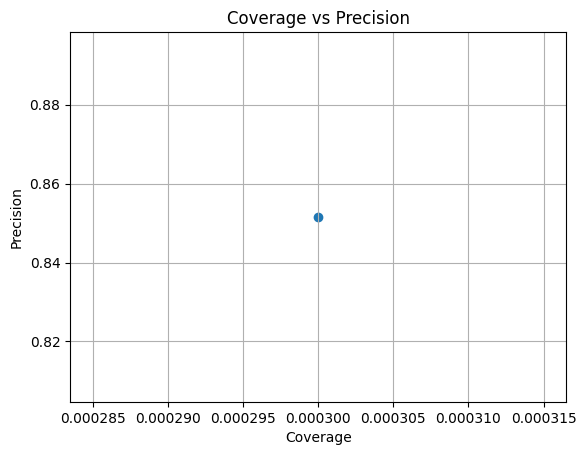

In [24]:
coverages = explanation.coverage
precisions = explanation.precision

plt.scatter(coverages, precisions)
plt.title('Coverage vs Precision')
plt.xlabel('Coverage')
plt.ylabel('Precision')
plt.grid(True)
plt.show()

## Observation:

**1. Interpretation of Precision and Coverage**
High Precision, Low Coverage: The point on the plot shows high precision but very low coverage. This means the rule is highly accurate for the instances it covers but applies to only a small subset of data.
Implication: Low coverage suggests that the rule might be too specific, capturing only a narrow set of instances. This could indicate overfitting or that the data has complex interactions not captured by simple rules


**2. Relation to Initial Recommendation**
Supports Caution: The rule’s narrow scope suggests the model may rely too heavily on specific features, like metro_encoded, confirming the need to refine these for broader applicability.


**3. Next Steps**
- Expand Rules: Identify broader patterns to understand the model more comprehensively.

- Simplify Model: Consider feature pruning and tuning to avoid overfitting.

- Align with Stakeholders: Share findings to ensure the model is fair and generalizes well.


<span style="color:red">**Files for quesiton 3 and Bonus can be found in canvas files at HW1/data/q3_bonus**</span>.

**3. Counterfactuals** <br>

You've decided to take out a loan to fund a start-up idea you and your fellow gradschool friends have. After applying, you get rejected (predict_proba score is below .5). You've decided to take matters into your own hands, and requested your information from the Bank. <br><br>

Using Counterfactuals, come up with a plan to get your loan approved. Write a letter to the bank (short write up), with your plan, demonstrating the steps your business can take to get approved.

**5pts**


In [91]:
X_test_data = pd.read_csv('HW1_q3_bonus_X_test_2.csv')
X_train_data = pd.read_csv('HW1_q3_bonus_X_train_2.csv')
y_test_data = pd.read_csv('HW1_q3_bonus_y_test_2.csv')
y_train_data = pd.read_csv('HW1_q3_bonus_y_train_2.csv')
loaded_model = pickle.load(open('HW1_q3_bonus_model_2.pkl', 'rb'))

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator DecisionTreeClassifier from version 1.5.0 when using version 1.5.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator AdaBoostClassifier from version 1.5.0 when using version 1.5.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [28]:
X_test_data.head()

,loan_amount,credit_score,business_age,number_employees,yearly_profit,industry
0,136548,770,9,30,16218,2
1,160681,800,10,1,16068,2
2,100851,770,9,9,45865,1
3,45784,560,2,25,44500,1
4,63271,560,2,7,15236,2


In [29]:
y_test_data.head()

,loan_approved
0,0
1,0
2,0
3,1
4,0


In [31]:
model_type = type(loaded_model)

print(f"The model type is: {model_type}")

The model type is: <class 'sklearn.ensemble._weight_boosting.AdaBoostClassifier'>


In [41]:
data = dice_ml.Data(dataframe=pd.concat([X_train_data, y_train_data], axis=1), continuous_features=['loan_amount', 'credit_score', 'business_age', 'number_employees', 'yearly_profit'], outcome_name='loan_approved')

model = dice_ml.Model(model=loaded_model, backend="sklearn")

exp = dice_ml.Dice(data, model)

In [59]:
# Let my loan application be X_test_data.iloc[0:1] since loan was not approved for this instance
dice_exp = exp.generate_counterfactuals(X_test_data.iloc[0:1], total_CFs=4, desired_class="opposite")
dice_exp.visualize_as_dataframe()


  0%|          | 0/1 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/dice_ml/explainer_interfaces/dice_random.py:116: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  candidate_cfs.at[k, selected_features[k][0]] = random_instances.at[k, selected_features[k][0]]
100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

Query instance (original outcome : 0)


,loan_amount,credit_score,business_age,number_employees,yearly_profit,industry,loan_approved
0,136548,770,9,30,16218,2,0



Diverse Counterfactual set (new outcome: 1)


,loan_amount,credit_score,business_age,number_employees,yearly_profit,industry,loan_approved
0,23156,770,9,30,16218,2,1
1,55078,770,9,26,16218,2,1
2,45475,770,9,30,16218,2,1
3,19110,770,9,30,16218,2,1


## Revised Proposal for loan application:

**Reduced Loan Amount**: Based on counterfactual analysis, lowering the requested loan to $45,000 significantly improves our approval likelihood.

**Financial and Operational Stability**: With a 770 credit score, steady profit of $16,218, and a 9-year business track record among our team, we’re well-prepared to meet financial commitments.

**Growth Potential**: Our dedicated team of 30 positions us to leverage the loan for scalable growth within industry category 2.

**Bonus**
<br><br>Search the underwriting model for any bias. Make sure to support your claims. Use any tools you want. Assume you only have access to the mode (and none of the training/test data)<br><br>
**1pts**


<Axes: >

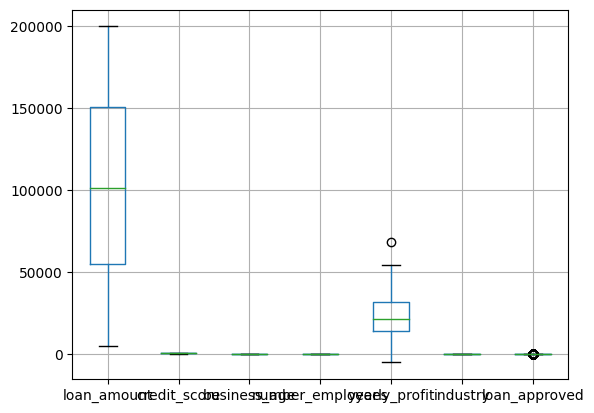

In [69]:
train_df = pd.concat([X_train_data, y_train_data], axis=1)
train_df.boxplot()

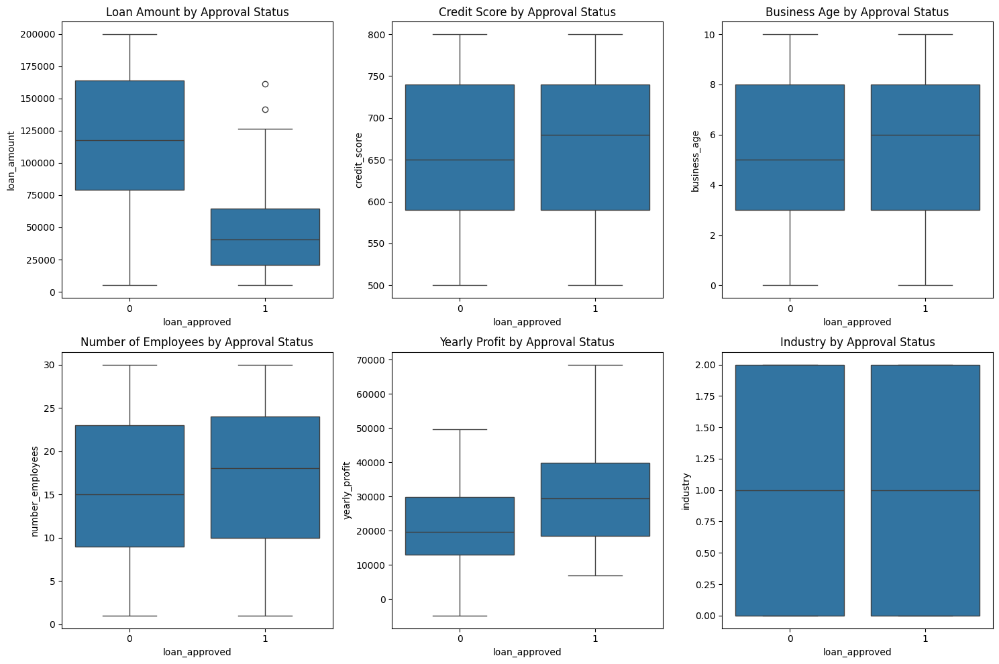

In [76]:
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

sns.boxplot(ax=axes[0, 0], x="loan_approved", y="loan_amount", data=train_df)
axes[0, 0].set_title('Loan Amount by Approval Status')

sns.boxplot(ax=axes[0, 1], x="loan_approved", y="credit_score", data=train_df)
axes[0, 1].set_title('Credit Score by Approval Status')

sns.boxplot(ax=axes[0, 2], x="loan_approved", y="business_age", data=train_df)
axes[0, 2].set_title('Business Age by Approval Status')

sns.boxplot(ax=axes[1, 0], x="loan_approved", y="number_employees", data=train_df)
axes[1, 0].set_title('Number of Employees by Approval Status')

sns.boxplot(ax=axes[1, 1], x="loan_approved", y="yearly_profit", data=train_df)
axes[1, 1].set_title('Yearly Profit by Approval Status')

sns.boxplot(ax=axes[1, 2], x="loan_approved", y="industry", data=train_df)
axes[1, 2].set_title('Industry by Approval Status')

plt.tight_layout()
plt.show()

# Observation

| Factor                  | Observation                                                                                      | Potential Bias                                     |
|-------------------------|--------------------------------------------------------------------------------------------------|----------------------------------------------------|
| **Loan Amount**         | Approved loans (1) tend to have lower loan amounts than not approved loans (0). The median loan amount for approved loans is significantly lower. | Bias against higher loan amounts.                  |
| **Credit Score**        | Distribution of credit scores is similar for both approved and not approved loans, with slightly higher medians for approved loans. | Minimal evidence of bias based on credit score.    |
| **Business Age**        | Both groups have similar distributions, but slightly older businesses tend to have a higher approval rate. | Slight preference for more established businesses. |
| **Number of Employees** | No significant difference in the number of employees between approved and not approved loans.    | Minimal evidence of bias based on employee count.  |
| **Yearly Profit**       | Approved loans tend to have higher yearly profits, with a noticeable difference in medians.      | Preference for businesses with higher profits.     |
| **Industry**            | Industry distribution appears similar across both groups.                                        | Minimal evidence of industry-based bias.           |

### Summary of Key Biases
- **Loan Amount:** Lower loan amounts are more likely to be approved.
- **Yearly Profit:** Higher yearly profits may increase the likelihood of loan approval.

In [92]:
y_pred = loaded_model.predict(X_test_data)
y_true = y_test_data.values.flatten()

In [93]:
TP_approved = np.sum((y_true == 1) & (y_pred == 1))
TP_not_approved = np.sum((y_true == 0) & (y_pred == 1))

# Equal Opportunity Difference
TPR_approved = TP_approved / np.sum(y_true == 1)
TPR_not_approved = TP_not_approved / np.sum(y_true == 0)
equal_opportunity_difference = TPR_approved - TPR_not_approved

# Disparate Impact
P_approved = TP_approved / len(y_true)
P_not_approved = TP_not_approved / len(y_true)
disparate_impact = P_approved / P_not_approved

# Statistical Parity
statistical_parity = P_approved

print("Equal Opportunity Difference:", equal_opportunity_difference)
print("Disparate Impact:", disparate_impact)
print("Statistical Parity:", statistical_parity)

Equal Opportunity Difference: 0.5870000000000001
Disparate Impact: 2.4545454545454546
Statistical Parity: 0.16363636363636364


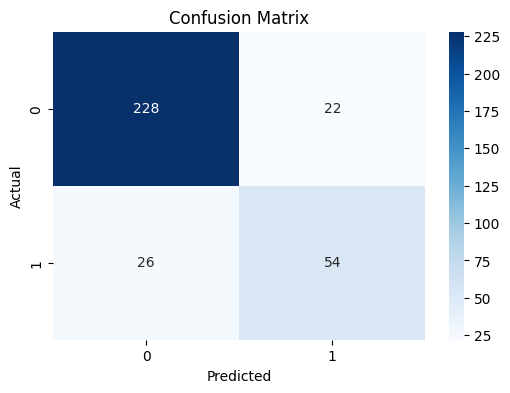

In [94]:
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()

# Observation

- Based on the confusion matrix, it is evident that the model is has a bias towards predicting the positive class (because of high number of false positives)
-  The disparate impact value of 2.45 suggests that one group is over twice as likely to be approved as another. Equal Opportunity Difference suggests a significant disparity in model’s ability to approve loans accurately for one group over another, indicating a potential bias against certain groups in loan approvals.